# Диплом
[1.Подготовка данных](#1.Подготовка-данных)<br>
[2.EDA](#2.EDA)<br>
[3.Проверка гипотез](#3.Проверка-гипотез)<br>
[4.Оценка возможности классификации](#4.Оценка-возможности-классификации)<br>
[5.Классификация](#5.Классификация)<br>
[6.Анализ новой классификации пользователей](#6.Анализ-новой-классификации-пользователей)<br>
[7.Модель классификации пользователей](#7.Модель-классификации-пользователей)<br>
[8.Общие выводы и рекомендации](#8.Общие-выводы-и-рекомендации)

## Постановка задачи

Как и любой бизнес, компания «Мегафон» хочет повысить удовлетворённость своих клиентов качеством услуг. Это важная задача для удержания пользователей — как давних, так и недавно привлечённых. Ведь затраты на маркетинг и продвижение не оправдаются, если клиент уйдёт из-за низкого качества связи. Однако в реальном мире ресурсы всегда ограничены, и в единицу времени технический отдел может решить конечное количество задач. <br>
Чтобы делать это наиболее эффективно, важно определить, какие технические показатели качества связи сильнее всего влияют на удовлетворённость клиентов, и в первую очередь направить ресурсы на работу с ними. Для этого «Мегафон» провёл опрос своих клиентов, предложив им оценить уровень удовлетворённости качеством связи. По каждому клиенту, прошедшему опрос, были собраны технические показатели. <br>
Подготовьте исследование для компании «Мегафон» и проанализируйте, как зависит (и зависит ли) оценка, которую ставит клиент в опросе, от технических показателей, которые были собраны. <br><br><br>

**Более подробно о проведённом опросе:**

В ходе опроса компания «Мегафон» предложила своим клиентам оценить уровень удовлетворённости качеством связи по десятибалльной шкале (где 10 — это «отлично», а 1 — «ужасно»). Если клиент оценивал качество связи на 9 или 10 баллов, опрос заканчивался. Если клиент ставил оценку ниже 9, задавался второй вопрос — о причинах неудовлетворённости качеством связи с предоставленными пронумерованными вариантами ответа. Ответ можно было дать в свободном формате или перечислить номера ответов через запятую. Ниже вы можете ознакомиться с инфографикой по структуре опроса.<br>



In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import scipy as sp
import seaborn as sns
import re
import os
import warnings
warnings.simplefilter('ignore')
import mymodule as my

## 1.Подготовка данных
[Top](#Диплом)

Посмотрим на наименования и типы данных

In [2]:
# /Users/Dmitrij/PycharmProjects/scientificProject/data/megafon.csv
data = pd.read_csv('megafon.csv')
data.head()
data.dtypes

user_id                                        int64
Q1                                            object
Q2                                            object
Total Traffic(MB)                            float64
Downlink Throughput(Kbps)                    float64
Uplink Throughput(Kbps)                      float64
Downlink TCP Retransmission Rate(%)          float64
Video Streaming Download Throughput(Kbps)    float64
Video Streaming xKB Start Delay(ms)            int64
Web Page Download Throughput(Kbps)           float64
Web Average TCP RTT(ms)                        int64
dtype: object

Проверим наличие пропусков

In [3]:
# Размерность данных и проверка данных на пропуски
print("Размерность данных:", data.shape)
data.isnull().sum()

Размерность данных: (3112, 11)


user_id                                         0
Q1                                              2
Q2                                           1797
Total Traffic(MB)                               0
Downlink Throughput(Kbps)                       0
Uplink Throughput(Kbps)                         0
Downlink TCP Retransmission Rate(%)             0
Video Streaming Download Throughput(Kbps)       0
Video Streaming xKB Start Delay(ms)             0
Web Page Download Throughput(Kbps)              0
Web Average TCP RTT(ms)                         0
dtype: int64

Удалим строки с отсутствующими ответами на  первый вопрос (Q1).<br>
Отсутствующие ответы на второй вопрос (Q2) заполним нулями и получим данные без пропусков.

In [4]:
# Удаление пропусков по  Q1
data.dropna(subset=['Q1'],inplace=True)
# Заполняем нулями пропуски по ответу Q2
data.fillna(0, inplace=True)
data.isnull().sum()

user_id                                      0
Q1                                           0
Q2                                           0
Total Traffic(MB)                            0
Downlink Throughput(Kbps)                    0
Uplink Throughput(Kbps)                      0
Downlink TCP Retransmission Rate(%)          0
Video Streaming Download Throughput(Kbps)    0
Video Streaming xKB Start Delay(ms)          0
Web Page Download Throughput(Kbps)           0
Web Average TCP RTT(ms)                      0
dtype: int64

Посмотрим на уникальный характер  данных

In [5]:
# Проведем исследование данных по каждой переменной
for col in list(data):
    unique_values = (data[col]).unique()
    nr_values = len(unique_values)
    if nr_values <= 20:    # пороговое значение на возможные категориальные данные
        print("Количество уникальных значений переменной {} составляет {} --- {}". \
              format(col, nr_values, unique_values))
    else:
        print("Количество уникальных значений переменной {} составляет {}". \
              format(col, nr_values))

Количество уникальных значений переменной user_id составляет 3110
Количество уникальных значений переменной Q1 составляет 49
Количество уникальных значений переменной Q2 составляет 52
Количество уникальных значений переменной Total Traffic(MB) составляет 3110
Количество уникальных значений переменной Downlink Throughput(Kbps) составляет 3100
Количество уникальных значений переменной Uplink Throughput(Kbps) составляет 2953
Количество уникальных значений переменной Downlink TCP Retransmission Rate(%) составляет 572
Количество уникальных значений переменной Video Streaming Download Throughput(Kbps) составляет 3106
Количество уникальных значений переменной Video Streaming xKB Start Delay(ms) составляет 1882
Количество уникальных значений переменной Web Page Download Throughput(Kbps) составляет 3095
Количество уникальных значений переменной Web Average TCP RTT(ms) составляет 583


**ВЫВОД:** Категориальных переменных кроме ответов на вопросы не выявлено

Для дальнейшего удобства при работе с  переменных создадим списки:
- lst_first это исходные имена переменных;
- lst_second это укороченные имена переменных;
- lst_info это описательные(перевод) имена переменных.

Созданные с помощью этих списков словари позволят менять имена данных в любом направлении.

In [6]:
# исходные имена
lst_first = [
 'Total Traffic(MB)',
 'Downlink Throughput(Kbps)',
 'Uplink Throughput(Kbps)',
 'Downlink TCP Retransmission Rate(%)',
 'Video Streaming Download Throughput(Kbps)',
 'Video Streaming xKB Start Delay(ms)',
 'Web Page Download Throughput(Kbps)',
 'Web Average TCP RTT(ms)'
    ]
lst_first

['Total Traffic(MB)',
 'Downlink Throughput(Kbps)',
 'Uplink Throughput(Kbps)',
 'Downlink TCP Retransmission Rate(%)',
 'Video Streaming Download Throughput(Kbps)',
 'Video Streaming xKB Start Delay(ms)',
 'Web Page Download Throughput(Kbps)',
 'Web Average TCP RTT(ms)']

In [7]:
# сокращенные (рабочие ) имена
lst_second = [
 'Total (MB)',
 'Downlink (Kbps)',
 'Uplink (Kbps)',
 'Downlink TCP Rate(%)',
 'Video Download (Kbps)',
 'Video Delay (ms)',
 'Web Download (Kbps)',
 'Web TCP RTT(ms)'
    ]
lst_second

['Total (MB)',
 'Downlink (Kbps)',
 'Uplink (Kbps)',
 'Downlink TCP Rate(%)',
 'Video Download (Kbps)',
 'Video Delay (ms)',
 'Web Download (Kbps)',
 'Web TCP RTT(ms)']

In [8]:
# описание переменных(перевод)
lst_info= [
 'Общий трафик (MB)',
 'Вх трафик (Kbps)',
 'Исх трафик(Kbps)',
 'Ошибка скачивание(%)',
 'Видео скачивание (Kbps)',
 'Видео задержка(ms)',
 'Web скачивание (Kbps)',
 'Web задержка (ms)'
    ]
lst_info

['Общий трафик (MB)',
 'Вх трафик (Kbps)',
 'Исх трафик(Kbps)',
 'Ошибка скачивание(%)',
 'Видео скачивание (Kbps)',
 'Видео задержка(ms)',
 'Web скачивание (Kbps)',
 'Web задержка (ms)']

In [9]:
#ПРИМЕР получение словаря
dict_1_2 = dict(zip(lst_first, lst_second))
dict_2_1 = dict(zip(lst_second, lst_first))
dict_1_info = dict(zip(lst_first, lst_info))
dict_2_info = dict(zip(lst_second, lst_info))
dict_1_2

{'Total Traffic(MB)': 'Total (MB)',
 'Downlink Throughput(Kbps)': 'Downlink (Kbps)',
 'Uplink Throughput(Kbps)': 'Uplink (Kbps)',
 'Downlink TCP Retransmission Rate(%)': 'Downlink TCP Rate(%)',
 'Video Streaming Download Throughput(Kbps)': 'Video Download (Kbps)',
 'Video Streaming xKB Start Delay(ms)': 'Video Delay (ms)',
 'Web Page Download Throughput(Kbps)': 'Web Download (Kbps)',
 'Web Average TCP RTT(ms)': 'Web TCP RTT(ms)'}

Переименуем переменные по схеме 1-2 (на короткие имена)

In [10]:
# переименование 1-2
data.rename(columns=dict(zip(lst_first, lst_second)), inplace= True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3110 entries, 0 to 3111
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                3110 non-null   int64  
 1   Q1                     3110 non-null   object 
 2   Q2                     3110 non-null   object 
 3   Total (MB)             3110 non-null   float64
 4   Downlink (Kbps)        3110 non-null   float64
 5   Uplink (Kbps)          3110 non-null   float64
 6   Downlink TCP Rate(%)   3110 non-null   float64
 7   Video Download (Kbps)  3110 non-null   float64
 8   Video Delay (ms)       3110 non-null   int64  
 9   Web Download (Kbps)    3110 non-null   float64
 10  Web TCP RTT(ms)        3110 non-null   int64  
dtypes: float64(6), int64(3), object(2)
memory usage: 291.6+ KB


Посмотрим уникальные ответы пользователей на первый вопрос.

In [11]:
# Посмотрим варианты ответы пользователей на первый вопрос опроса
data['Q1'].unique()

array(['5', '1', '8', '2', '3', '9', '10', '7', '4', '11', '6', '2, 9',
       '0', '1, 3', '19', '15', '1, 6', '***** ** ***',
       '3 - дер.Ширяево Волоколамского района, 9 - в Москве', '10, 9',
       'Чем даль ше,тем лучше.Спасибо за ваш труд.Оценка 10 !',
       'ОЦЕНКА-3/НЕВАЖНО/', 'Отвратительно',
       'Я ценой услуг не удовлетворен', 'Пока не понял', '3, 9', '5, 6',
       '0, 1, 5', '5, 7', 'Hi',
       '4. Тульская область Заокский район. Романовские дачи связи почти нет',
       'Немагу дать атценку денги незашто снимаеть скоро выклучаю',
       '10, 50',
       'Очень  хорошо. Обслуживания  я довольно. Спасибо вам.555', '?',
       'Поохое',
       'Когда в Москве-10 а когда в калужской области в деревне Бели-1',
       'Нет', 'Да', 'Ужасно',
       '3 тройка, связь отвратительная, жалко платить за такой тарив',
       'Чдтчдтччдтччч', '3, 7', '20, 89031081392', '1, 8', 'Без з',
       '10, 5', '2, 5',
       'Я в Смол. Области живу сейчас, не пользуюсь телефоном совсем

В ответах присутсвуют варианты, которые ясны по содержанию, но неправильные по форме.
Такие ответы можно правильно классифицировать. Также существуют ответы, которые не имеют четкой классификации. Такие данные необходимо выделить для дальнейшей обработки или удаления.


### Обработка первого вопроса (Q1)

In [12]:
# Функция  расшифровки ответа пользователей на первый вопрос
def translate_sms_1(answer_str):
    """
    answer_str ответ клиента
    """
    # корректный словарь ответов
    correct = {'1':0, '2':0, '3':0, '4':0, '5':0, '6':0, '7':0, '8':0, '9':1, '10':1}
    lst_corr =[]
    clear_sms = 0
    positiv = 0

    sms = re.sub('\W', ' ', answer_str).split() # разделяем на слова с помощью регулярных  выражений
    for s in sms:
        if s in correct:
            lst_corr.append(correct[s]) # формируем список корректных ответов
        else:
            lst_corr.append(0)

    if len(lst_corr) == 1:
            clear_sms = 1
    if  sum(lst_corr) > 0:
        positiv  = 1

        # sms ответ по словам
        # lst_corr  список корректных слов в ответе
        # clear_sms признак одназначно корректного ответа
        # posiitv  признак позитивного ответа
    return sms, lst_corr, clear_sms, positiv

Получим и расшифруем ответы первого вопроса

In [13]:
# Получение фрейма уникальных ответов
translate_q1 = pd.DataFrame(data['Q1'].unique()).rename(columns={0:'sms_1'})

In [14]:
# Расшифруем ответы и запишем в фрейм ответов с признаками для анализа
# список с ответом
translate_q1['answer'] = translate_q1.apply(lambda xx: translate_sms_1(str(xx['sms_1']))[0], axis = 1)
# однозначный ответ (одно слово)
translate_q1['clear_1'] = translate_q1.apply(lambda xx: translate_sms_1(str(xx['sms_1']))[2], axis = 1)
#  признак позитивности ответа
translate_q1['positiv_1'] = translate_q1.apply(lambda xx: translate_sms_1(str(xx['sms_1']))[3], axis = 1)
translate_q1

,sms_1,answer,clear_1,positiv_1
0,5,[5],1,0
1,1,[1],1,0
2,8,[8],1,0
3,2,[2],1,0
4,3,[3],1,0
5,9,[9],1,1
6,10,[10],1,1
7,7,[7],1,0
8,4,[4],1,0
9,11,[11],1,0


Теперь ответы имеют два логических признака:
- Однозначность (clear)
- Позитивность (positiv)

Проведем разбор каждого сочетания признаков для получения **результирующего ответа** со следующими значениями:

 - Качество связи:"Удовлетворительное" или "Неудовлетворительное" (__Q1_cat__)
 - Степень удовлетворенности от 10 до 1 (Отлично - Ужасно)(__Q1_res__).Если ответ не удалось классифицировать, то ставим Ноль.

__Ответы типа : clear = 0,  positiv = 0__

In [15]:
# проверка нечетких ответов без позитива
clear_0_positiv_0 = translate_q1[(translate_q1.clear_1 == 0) & (translate_q1.positiv_1 == 0) ]
# Формируем  результат по данной группе ответов
clear_0_positiv_0.loc[:,'Q1_res'] = 0
clear_0_positiv_0.loc[:,'Q1_cat'] = 0
clear_0_positiv_0

,sms_1,answer,clear_1,positiv_1,Q1_res,Q1_cat
13,"1, 3","[1, 3]",0,0,0,0
16,"1, 6","[1, 6]",0,0,0,0
17,***** ** ***,[],0,0,0,0
21,ОЦЕНКА-3/НЕВАЖНО/,"[ОЦЕНКА, 3, НЕВАЖНО]",0,0,0,0
23,Я ценой услуг не удовлетворен,"[Я, ценой, услуг, не, удовлетворен]",0,0,0,0
24,Пока не понял,"[Пока, не, понял]",0,0,0,0
26,"5, 6","[5, 6]",0,0,0,0
27,"0, 1, 5","[0, 1, 5]",0,0,0,0
28,"5, 7","[5, 7]",0,0,0,0
30,4. Тульская область Заокский район. Романовски...,"[4, Тульская, область, Заокский, район, Романо...",0,0,0,0


Получим форму словаря, с помощью которой будем вносить коррективы при уточнении ответов.

In [16]:
# Получим форму словаря для корректировки ответов
lst_indx = list(clear_0_positiv_0.index)
lst_sms_1 = list(clear_0_positiv_0['sms_1'])
dict(zip(lst_indx,lst_sms_1))

{13: '1, 3',
 16: '1, 6',
 17: '***** ** ***',
 21: 'ОЦЕНКА-3/НЕВАЖНО/',
 23: 'Я ценой услуг не удовлетворен',
 24: 'Пока не понял',
 26: '5, 6',
 27: '0, 1, 5',
 28: '5, 7',
 30: '4. Тульская область Заокский район. Романовские дачи связи почти нет',
 31: 'Немагу дать атценку денги незашто снимаеть скоро выклучаю',
 33: 'Очень  хорошо. Обслуживания  я довольно. Спасибо вам.555',
 34: '?',
 40: '3 тройка, связь отвратительная, жалко платить за такой тарив',
 42: '3, 7',
 43: '20, 89031081392',
 44: '1, 8',
 45: 'Без з',
 47: '2, 5',
 48: 'Я в Смол. Области живу сейчас, не пользуюсь телефоном совсем'}

Вносимые корректировки по параметру "степени удовлетворения" (Q1_res)

In [17]:
# Корректировка ответа для Q1_res по умолчанию 0
corr_Q1_res = {
                13: 1,#'1, 3',
                16: 1,#'1, 6',
                # 17: '***** ** ***',
                21: 3,#'ОЦЕНКА-3/НЕВАЖНО/',
                # 23: 'Я ценой услуг не удовлетворен',
                # 24: 'Пока не понял',
                26: 5,#'5, 6',
                27: 1,#'0, 1, 5',
                28: 5,#'5, 7',
                30: 4,#'4. Тульская область Заокский район. Романовские дачи связи почти нет',
                # 31: 'Немагу дать атценку денги незашто снимаеть скоро выклучаю',
                33: 9,#'Очень  хорошо. Обслуживания  я довольно. Спасибо вам.555',
                # 34: '?',
                40: 3,#'3 тройка, связь отвратительная, жалко платить за такой тарив',
                42: 3,#'3, 7',
                # 43: '20, 89031081392',
                44: 1,#'1, 8',
                # 45: 'Без з',
                47: 2,#'2, 5',
                # 48: 'Я в Смол. Области живу сейчас, не пользуюсь телефоном совсем'
            }
corr_Q1_res

{13: 1,
 16: 1,
 21: 3,
 26: 5,
 27: 1,
 28: 5,
 30: 4,
 33: 9,
 40: 3,
 42: 3,
 44: 1,
 47: 2}

Вносимые корректировки по параметру "качество связи" (Q1_cat)

In [18]:
# Корректировка ответа для Q1_cat по умолчанию 0
corr_Q1_cat = {
                # 13: '1, 3',
                # 16: '1, 6',
                # 17: '***** ** ***',
                # 21: 'ОЦЕНКА-3/НЕВАЖНО/',
                # 23: 'Я ценой услуг не удовлетворен',
                # 24: 'Пока не понял',
                # 26: '5, 6',
                # 27: '0, 1, 5',
                # 28: '5, 7',
                # 30: '4. Тульская область Заокский район. Романовские дачи связи почти нет',
                # 31: 'Немагу дать атценку денги незашто снимаеть скоро выклучаю',
                33: 1,# 'Очень  хорошо. Обслуживания  я довольно. Спасибо вам.555',
                # 34: '?',
                # 40: '3 тройка, связь отвратительная, жалко платить за такой тарив',
                # 42: '3, 7',
                # 43: '20, 89031081392',
                # 44: '1, 8',
                # 45: 'Без з',
                # 47: '2, 5',
                # 48: 'Я в Смол. Области живу сейчас, не пользуюсь телефоном совсем'
          }
corr_Q1_cat

{33: 1}

In [19]:
#Внесем корректировки по Q1_res
for item in corr_Q1_res:
    clear_0_positiv_0.loc[item, 'Q1_res'] = corr_Q1_res[item]

In [20]:
#Внесем корректировки по Q1_cat
for item in corr_Q1_cat:
    clear_0_positiv_0.loc[item, 'Q1_cat'] = corr_Q1_cat[item]

Результат с корректировками

In [21]:
clear_0_positiv_0

,sms_1,answer,clear_1,positiv_1,Q1_res,Q1_cat
13,"1, 3","[1, 3]",0,0,1,0
16,"1, 6","[1, 6]",0,0,1,0
17,***** ** ***,[],0,0,0,0
21,ОЦЕНКА-3/НЕВАЖНО/,"[ОЦЕНКА, 3, НЕВАЖНО]",0,0,3,0
23,Я ценой услуг не удовлетворен,"[Я, ценой, услуг, не, удовлетворен]",0,0,0,0
24,Пока не понял,"[Пока, не, понял]",0,0,0,0
26,"5, 6","[5, 6]",0,0,5,0
27,"0, 1, 5","[0, 1, 5]",0,0,1,0
28,"5, 7","[5, 7]",0,0,5,0
30,4. Тульская область Заокский район. Романовски...,"[4, Тульская, область, Заокский, район, Романо...",0,0,4,0


__Ответы типа : clear = 0,  positiv = 1__

In [22]:
# проверка нечетких ответов c позитивом на возможность положительного отзыва
clear_0_positiv_1 = translate_q1[(translate_q1.clear_1 == 0) & (translate_q1.positiv_1 == 1) ]
# Формируем  результат по данной группе ответов
clear_0_positiv_1.loc[:,'Q1_res'] = 0
clear_0_positiv_1.loc[:,'Q1_cat'] = 1
clear_0_positiv_1

,sms_1,answer,clear_1,positiv_1,Q1_res,Q1_cat
11,"2, 9","[2, 9]",0,1,0,1
18,"3 - дер.Ширяево Волоколамского района, 9 - в М...","[3, дер, Ширяево, Волоколамского, района, 9, в...",0,1,0,1
19,"10, 9","[10, 9]",0,1,0,1
20,"Чем даль ше,тем лучше.Спасибо за ваш труд.Оцен...","[Чем, даль, ше, тем, лучше, Спасибо, за, ваш, ...",0,1,0,1
25,"3, 9","[3, 9]",0,1,0,1
32,"10, 50","[10, 50]",0,1,0,1
36,Когда в Москве-10 а когда в калужской области ...,"[Когда, в, Москве, 10, а, когда, в, калужской,...",0,1,0,1
46,"10, 5","[10, 5]",0,1,0,1


Получим форму словаря, с помощью которой будем вносить коррективы при уточнении ответов.

In [23]:
# сформируе словарь корректировок
lst_indx = list(clear_0_positiv_1.index)
lst_sms_1 = list(clear_0_positiv_1['sms_1'])
dict(zip(lst_indx,lst_sms_1))

{11: '2, 9',
 18: '3 - дер.Ширяево Волоколамского района, 9 - в Москве',
 19: '10, 9',
 20: 'Чем даль ше,тем лучше.Спасибо за ваш труд.Оценка 10 !',
 25: '3, 9',
 32: '10, 50',
 36: 'Когда в Москве-10 а когда в калужской области в деревне Бели-1',
 46: '10, 5'}

Вносимые корректировки по параметру "степени удовлетворения" (Q1_res)

In [24]:
# по умолчанию 0
corr_Q1_res = {
                # 11: '2, 9',
                # 18: '3 - дер.Ширяево Волоколамского района, 9 - в Москве',
                19: 10,#'10, 9',
                20: 10,#'Чем даль ше,тем лучше.Спасибо за ваш труд.Оценка 10 !',
                # 25: '3, 9',
                32: 10,#'10, 50',
                36: 10,#'Когда в Москве-10 а когда в калужской области в деревне Бели-1',
                46: 10,#'10, 5'
            }
corr_Q1_res

{19: 10, 20: 10, 32: 10, 36: 10, 46: 10}

Вносимые корректировки по параметру "качество связи" (Q1_cat)

In [25]:
# по умолчанию 1
corr_Q1_cat = {
                11: 0,#'2, 9',
                18: 0,#'3 - дер.Ширяево Волоколамского района, 9 - в Москве',
                # 19: '10, 9',
                # 20: 'Чем даль ше,тем лучше.Спасибо за ваш труд.Оценка 10 !',
                25: 0,#'3, 9',
                # 32: '10, 50',
                # 36: 'Когда в Москве-10 а когда в калужской области в деревне Бели-1',
                # 46: '10, 5'
            }
corr_Q1_cat

{11: 0, 18: 0, 25: 0}

In [26]:
#Внесем корректировки по Q1_res
for item in corr_Q1_res:
    clear_0_positiv_1.loc[item, 'Q1_res'] = corr_Q1_res[item]

In [27]:
#Внесем корректировки по Q1_cat
for item in corr_Q1_cat:
    clear_0_positiv_1.loc[item, 'Q1_cat'] = corr_Q1_cat[item]

Результат с корректировками

In [28]:
clear_0_positiv_1

,sms_1,answer,clear_1,positiv_1,Q1_res,Q1_cat
11,"2, 9","[2, 9]",0,1,0,0
18,"3 - дер.Ширяево Волоколамского района, 9 - в М...","[3, дер, Ширяево, Волоколамского, района, 9, в...",0,1,0,0
19,"10, 9","[10, 9]",0,1,10,1
20,"Чем даль ше,тем лучше.Спасибо за ваш труд.Оцен...","[Чем, даль, ше, тем, лучше, Спасибо, за, ваш, ...",0,1,10,1
25,"3, 9","[3, 9]",0,1,0,0
32,"10, 50","[10, 50]",0,1,10,1
36,Когда в Москве-10 а когда в калужской области ...,"[Когда, в, Москве, 10, а, когда, в, калужской,...",0,1,10,1
46,"10, 5","[10, 5]",0,1,10,1


__Ответы типа : clear = 1__

In [29]:
#Группа  условно четких ответов
clear_1_positiv = translate_q1[(translate_q1.clear_1 == 1)]
# Формируем  результат по данной группе ответов
clear_1_positiv.loc[:,'Q1_res'] = 0
clear_1_positiv.loc[:,'Q1_cat'] = 0
clear_1_positiv

,sms_1,answer,clear_1,positiv_1,Q1_res,Q1_cat
0,5,[5],1,0,0,0
1,1,[1],1,0,0,0
2,8,[8],1,0,0,0
3,2,[2],1,0,0,0
4,3,[3],1,0,0,0
5,9,[9],1,1,0,0
6,10,[10],1,1,0,0
7,7,[7],1,0,0,0
8,4,[4],1,0,0,0
9,11,[11],1,0,0,0


Получим форму словаря, с помощью которой будем вносить коррективы при уточнении ответов.

In [30]:
# сформируе словарь корректировок
lst_indx = list(clear_1_positiv.index)
lst_sms_1 = list(clear_1_positiv['sms_1'])
dict(zip(lst_indx,lst_sms_1))

{0: '5',
 1: '1',
 2: '8',
 3: '2',
 4: '3',
 5: '9',
 6: '10',
 7: '7',
 8: '4',
 9: '11',
 10: '6',
 12: '0',
 14: '19',
 15: '15',
 22: 'Отвратительно',
 29: 'Hi',
 35: 'Поохое',
 37: 'Нет',
 38: 'Да',
 39: 'Ужасно',
 41: 'Чдтчдтччдтччч'}

Вносимые корректировки по параметру "степени удовлетворения" (Q1_res)

In [31]:
# по умолчанию 0
corr_Q1_res = {
                 0: 5,#'5',
                 1: 1,#'1',
                 2: 8,#'8',
                 3: 2,#'2',
                 4: 3,#'3',
                 5: 9,#'9',
                 6: 10,#'10',
                 7: 7,#'7',
                 8: 4,#'4',
                 # 9: '11',
                 10: 6,#'6',
                 # 12: '0',
                 # 14: '19',
                 # 15: '15',
                 22: 2,#'Отвратительно',
                 # 29: 'Hi',
                 35: 5,#'Поохое',
                 # 37: 'Нет',
                 # 38: 'Да',
                 39: 1,#'Ужасно',
                 # 41: 'Чдтчдтччдтччч'
            }
corr_Q1_res

{0: 5,
 1: 1,
 2: 8,
 3: 2,
 4: 3,
 5: 9,
 6: 10,
 7: 7,
 8: 4,
 10: 6,
 22: 2,
 35: 5,
 39: 1}

Вносимые корректировки по параметру "качество связи" (Q1_cat)

In [32]:
# по умолчанию 0
corr_Q1_cat = {
                 # 0: '5',
                 # 1: '1',
                 # 2: '8',
                 # 3: '2',
                 # 4: '3',
                 5: 1,#'9',
                 6: 1,#'10',
                 # 7: '7',
                 # 8: '4',
                 # 9: '11',
                 # 10: '6',
                 # 12: '0',
                 # 14: '19',
                 # 15: '15',
                 # 22: 'Отвратительно',
                 # 29: 'Hi',
                 # 35: 'Поохое',
                 # 37: 'Нет',
                 # 38: 'Да',
                 # 39: 'Ужасно',
                 # 41: 'Чдтчдтччдтччч'
            }

corr_Q1_cat

{5: 1, 6: 1}

In [33]:
#Внесем корректировки по Q1_res
for item in corr_Q1_res:
    clear_1_positiv.loc[item, 'Q1_res'] = corr_Q1_res[item]

In [34]:
#Внесем корректировки по Q1_cat
for item in corr_Q1_cat:
    clear_1_positiv.loc[item, 'Q1_cat'] = corr_Q1_cat[item]

Результат с корректировками

In [35]:
clear_1_positiv

,sms_1,answer,clear_1,positiv_1,Q1_res,Q1_cat
0,5,[5],1,0,5,0
1,1,[1],1,0,1,0
2,8,[8],1,0,8,0
3,2,[2],1,0,2,0
4,3,[3],1,0,3,0
5,9,[9],1,1,9,1
6,10,[10],1,1,10,1
7,7,[7],1,0,7,0
8,4,[4],1,0,4,0
9,11,[11],1,0,0,0


Сохраним результаты корректировок в общую таблицу с параметрами связи

In [36]:
#Запишем результат в общую таблицу ответов Q1
translate_q1= pd.concat([clear_1_positiv, clear_0_positiv_0 , clear_0_positiv_1]).sort_index()
#Объединим ответы  с параметрами связи в один фрейм
data_res = pd.merge(translate_q1, data, how = 'inner', left_on = 'sms_1', right_on = 'Q1')
# Оставим ответ в чистом виде
data_res = data_res.drop(['sms_1','answer','clear_1','positiv_1','Q1'], axis = 1)
data_res.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3110 entries, 0 to 3109
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Q1_res                 3110 non-null   int64  
 1   Q1_cat                 3110 non-null   int64  
 2   user_id                3110 non-null   int64  
 3   Q2                     3110 non-null   object 
 4   Total (MB)             3110 non-null   float64
 5   Downlink (Kbps)        3110 non-null   float64
 6   Uplink (Kbps)          3110 non-null   float64
 7   Downlink TCP Rate(%)   3110 non-null   float64
 8   Video Download (Kbps)  3110 non-null   float64
 9   Video Delay (ms)       3110 non-null   int64  
 10  Web Download (Kbps)    3110 non-null   float64
 11  Web TCP RTT(ms)        3110 non-null   int64  
dtypes: float64(6), int64(5), object(1)
memory usage: 315.9+ KB


### Обработка второго вопроса (Q2)

In [37]:
# Прочитаем уникальные ответы Q2
translate_q2 = pd.DataFrame(data_res['Q2'].unique()).rename(columns={0:'sms_2'})

In [38]:
#Функция расшифровки ответа на второй вопрос
def translate_sms_2(str):

 # корректный словарь ответов
    correct = {'1':1, '2':2, '3':3, '4':4, '5':5, '6':6, '7':7}

    lst_corr =[]
    lst_err = []
    err = 0
    sms = re.sub('\W', ' ', str).split()
    for s in sms:
        if s in correct:
            lst_corr.append(correct[s])
        else:
            lst_err.append(s)
    if len(lst_err) >= 1:
        err = 1
    return sms, lst_corr , lst_err, err

Получим и расшифруем ответы второго вопроса

In [39]:
# # Расшифруем ответы и запишем в фрейм ответов с признаками для анализа
translate_q2['answer'] = translate_q2.apply(lambda x: translate_sms_2(str(x['sms_2']))[0], axis = 1)
# корректные ответы
translate_q2['corr_lst'] = translate_q2.apply(lambda x: translate_sms_2(str(x['sms_2']))[1], axis = 1)
#ошибочные ответы
translate_q2['err_lst'] = translate_q2.apply(lambda x: translate_sms_2(str(x['sms_2']))[2], axis = 1)
# общий признак ошибки
translate_q2['err'] = translate_q2.apply(lambda x: translate_sms_2(str(x['sms_2']))[3], axis = 1)
translate_q2

,sms_2,answer,corr_lst,err_lst,err
0,0,[0],[],[0],1
1,4,[4],[4],[],0
2,3,[3],[3],[],0
3,"1, 2, 3, 4","[1, 2, 3, 4]","[1, 2, 3, 4]",[],0
4,1,[1],[1],[],0
5,"3, 4","[3, 4]","[3, 4]",[],0
6,"1, 3, 4","[1, 3, 4]","[1, 3, 4]",[],0
7,"3, 4, 5","[3, 4, 5]","[3, 4, 5]",[],0
8,7,[7],[7],[],0
9,"1, 3","[1, 3]","[1, 3]",[],0


Посмотрим ошибки на возможные корректировки

In [40]:
# Просмотрим ошибки на возможные корректировки
err_q2 = translate_q2[translate_q2['err'] == 1]
err_q2

,sms_2,answer,corr_lst,err_lst,err
0,0,[0],[],[0],1
31,"0, 1, 7","[0, 1, 7]","[1, 7]",[0],1
33,"0, 3","[0, 3]",[3],[0],1
36,"1, 2, 34","[1, 2, 34]","[1, 2]",[34],1
40,10,[10],[],[10],1
41,0,[0],[],[0],1
46,"0, 05, 2, 27, 7","[0, 05, 2, 27, 7]","[2, 7]","[0, 05, 27]",1


Получим форму словаря с помощью, которой будем вносить коррективы при уточнении ответов.

In [41]:
# сформируе словарь корректировок
lst_indx = list(err_q2.index)
lst_sms_1 = list(err_q2['sms_2'])
dict(zip(lst_indx,lst_sms_1))


{0: 0,
 31: '0, 1, 7',
 33: '0, 3',
 36: '1, 2, 34',
 40: '10',
 41: '0',
 46: '0, 05, 2, 27, 7'}

Вносимые корректировки по параметру "корректные ответы" (corr_lst)

In [42]:
# построим словарь вносимых коректировок
# запишем последовательности которые изменят значения в столбце corr_lst
corr_dict = {
                # 0: 0,
                # 31: '0, 1, 7',
                # 33: '0, 3',
                36: '[1,2,3,4]',#'1, 2, 34',
                # 40: '10',
                # 41: '0',
                # 46: '0, 05, 2, 27, 7'
            }
corr_dict

{36: '[1,2,3,4]'}

In [43]:
#Внесем корректировки в translate_q2
for item in corr_dict:
    translate_q2.loc[item, 'corr_lst'] = corr_dict[item]

Результат с корректировками

In [44]:
translate_q2[translate_q2['err'] == 1]

,sms_2,answer,corr_lst,err_lst,err
0,0,[0],[],[0],1
31,"0, 1, 7","[0, 1, 7]","[1, 7]",[0],1
33,"0, 3","[0, 3]",[3],[0],1
36,"1, 2, 34","[1, 2, 34]","[1,2,3,4]",[34],1
40,10,[10],[],[10],1
41,0,[0],[],[0],1
46,"0, 05, 2, 27, 7","[0, 05, 2, 27, 7]","[2, 7]","[0, 05, 27]",1


In [45]:
# Функция поиска корректного ответа в списке ответов
def in_lst(lst, p):

    if lst.count(p) > 0:
        return p
    else:
        return 0

In [46]:
# функция разделения списка корректных ответов на отдельные типы ответа
def write_sms2(df):
    answer = [1,2,3,4,5,6,7]
    res = df[[ 'sms_2','corr_lst']]
    res['type_responce'] = 0

    for s in answer:# перебираем все варианты корректных ответов
        if s == 1:
            # для первого прохода цикла
            res['type_responce'] =  res.apply(lambda x: in_lst(list(x.corr_lst),s), axis = 1)

        if s > 1:
            # Остальные проходы цикла
            buf = df[[ 'sms_2','corr_lst']]
            buf['type_responce'] =  buf.apply(lambda x: in_lst(list(x.corr_lst),s), axis = 1)
            # добавили строки к результату
            res = pd.concat([res, buf])
            # убрали строки с нулями (где небыло сопадения с ответом)
            res = res[res['type_responce'] != 0]
    return res.sort_index()

In [47]:
# получили фрейм сооответствия корректных ответов на второй вопрос по отдельным типам вопроса
translate_q2  =  write_sms2(translate_q2)

Сохраним результаты корректировок в общую таблицу с параметрами связи

In [48]:
#Объединим ответы  с параметрами связи в один фрейм
data_Q2 = pd.merge(translate_q2, data_res, how = 'inner', left_on = 'sms_2', right_on = 'Q2')
data_Q2.drop(['sms_2','Q2'],axis=1, inplace=True)
data_Q2.rename(columns={'type_responce':'Q2_res','corr_lst':'Q2_lst'},inplace=True)

# подготовим данные по типам ответа Q2 для записи в общую таблицу
temp = pd.crosstab(data_Q2['user_id'], data_Q2['Q2_res'],
            margins=False).reset_index().rename(columns={1:'Q2_1',2:'Q2_2',3:'Q2_3',4:'Q2_4',
                                                         5:'Q2_5',6:'Q2_6',7:'Q2_7' })
temp['Q2_all'] = temp['Q2_1'] + temp['Q2_2'] + temp['Q2_3'] +\
                 temp['Q2_4'] + temp['Q2_5'] + temp['Q2_6'] + temp['Q2_7']
# Запишем в данные в единую таблицу
data_all = pd.merge(data_res,temp, how = 'left', left_on = 'user_id', right_on = 'user_id')

# Заполним  нулями отсутвующие ответы на вопрос Q2
data_all.fillna(0, inplace= True)
data_all.drop('Q2',inplace=True,axis=1)
data_all = data_all.astype({'Q2_1':int,'Q2_2':int,'Q2_3':int,
                            'Q2_4':int,'Q2_5': int,'Q2_6':int,'Q2_7':int, 'Q2_all':int})
data_all.head()

,Q1_res,Q1_cat,user_id,Total (MB),Downlink (Kbps),Uplink (Kbps),Downlink TCP Rate(%),Video Download (Kbps),Video Delay (ms),Web Download (Kbps),Web TCP RTT(ms),Q2_1,Q2_2,Q2_3,Q2_4,Q2_5,Q2_6,Q2_7,Q2_all
0,5,0,1,775.48846,360.13,86.56,3.93,1859.15,2309,1007.82,83,0,0,0,0,0,0,0,0
1,5,0,2,861.96324,3023.54,411.18,1.27,667.47,2080,255.36,425,0,0,0,1,0,0,0,1
2,5,0,64,347.71301,667.61,24.36,3.22,894.42,3803,608.59,807,0,0,0,0,0,0,0,0
3,5,0,83,758.32914,2934.23,231.69,1.25,7256.13,1638,3280.88,33,0,0,0,0,0,0,0,0
4,5,0,87,429.77113,14457.02,227.59,0.17,29670.67,848,2934.00,50,0,0,0,0,0,0,0,0


Подготовка данных завершена.

# 2.EDA
[Top](#Диплом)

Посмотрим на основные характеристики качества связи

In [49]:
# Получение описания данных одним пакетом
out_look, out_df = my.data_describe(data_all[lst_second],style = 2)
out_look


,Type,Total (MB),Downlink (Kbps),Uplink (Kbps),Downlink TCP Rate(%),Video Download (Kbps),Video Delay (ms),Web Download (Kbps),Web TCP RTT(ms)
count,A00,3110.000000,3110.000000,3110.000000,3110.000000,3110.000000,3110.000000,3110.000000,3110.000000
NaN_count,A01,0,0,0,0,0,0,0,0
mean,B01,406.169902,2219.122138,170.715154,1.834270,5728.363527,2108.026367,2100.275637,194.238264
std,B02,220.493683,2629.116963,204.087358,2.074831,5162.876277,1582.815819,2063.004564,267.462063
variance,B03,48601.831410,6910033.412563,41638.256743,4.303539,26646720.620354,2504500.353003,4254619.348012,71512.953198
lower_limit,C00,-323.318984,-2604.526250,-139.202500,-1.560000,-5600.005000,-266.750000,-1235.181250,-125.500000
min,C01,100.026680,13.260000,6.110000,0.050000,0.000000,239.000000,0.000000,0.000000
25%,C02,214.062358,652.112500,70.685000,0.720000,2324.210000,1280.500000,1017.807500,74.000000
50%,C03,363.999720,1402.260000,119.435000,1.300000,4435.180000,1672.000000,1670.695000,118.000000
75%,C04,572.316585,2823.205000,210.610000,2.240000,7607.020000,2312.000000,2519.800000,207.000000


__ВЫВОД:__<br>
Все переменные ,кроме  Total (MB), имеют следующие особенности:<br>
- значительная положительная ассиметрия (смещение вправо) ;<br>
- очень высокое значение эксцесса;<br>
- большой размах данных;<br>
- высокое значение дисперсии.


Посмотрим на распределение данных и оценим их соответствие нормальному распределению.

Шапиро-тест переменной Total (MB):
 ShapiroResult(statistic=0.9362558126449585, pvalue=1.3797234077194574e-34)
Шапиро-тест переменной Downlink (Kbps):
 ShapiroResult(statistic=0.6727179288864136, pvalue=0.0)
Шапиро-тест переменной Uplink (Kbps):
 ShapiroResult(statistic=0.5270669460296631, pvalue=0.0)
Шапиро-тест переменной Downlink TCP Rate(%):
 ShapiroResult(statistic=0.6031284332275391, pvalue=0.0)
Шапиро-тест переменной Video Download (Kbps):
 ShapiroResult(statistic=0.7906444072723389, pvalue=0.0)
Шапиро-тест переменной Video Delay (ms):
 ShapiroResult(statistic=0.6259993314743042, pvalue=0.0)
Шапиро-тест переменной Web Download (Kbps):
 ShapiroResult(statistic=0.6234810948371887, pvalue=0.0)
Шапиро-тест переменной Web TCP RTT(ms):
 ShapiroResult(statistic=0.4836292862892151, pvalue=0.0)


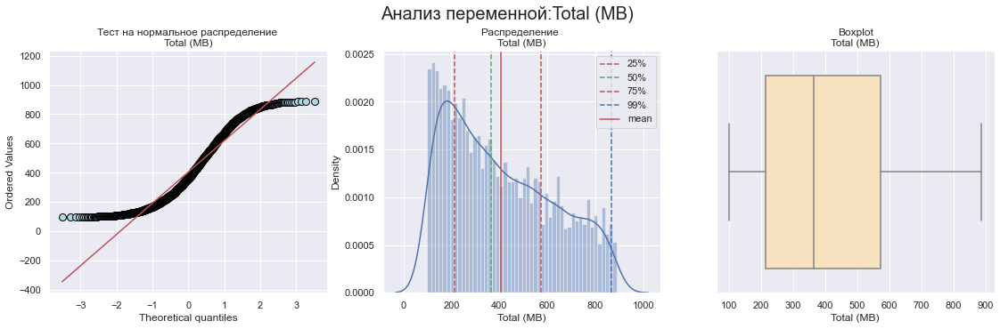

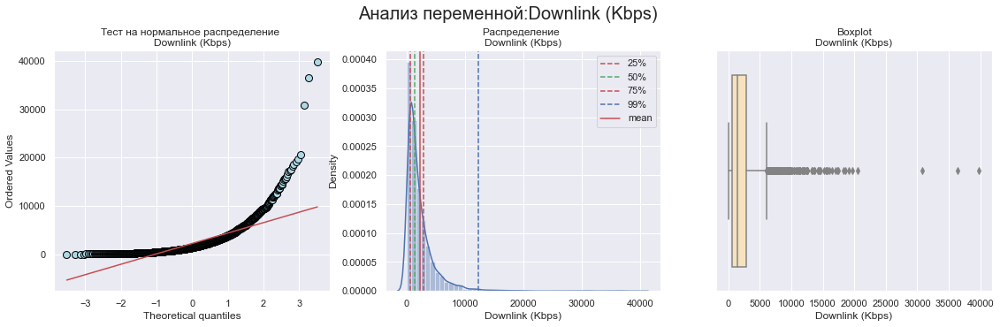

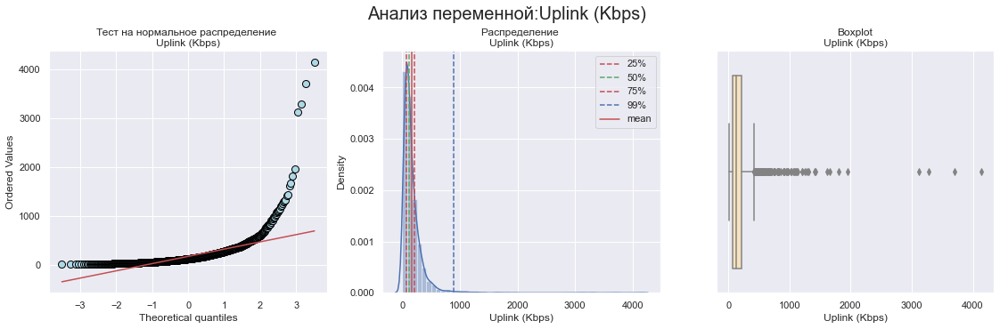

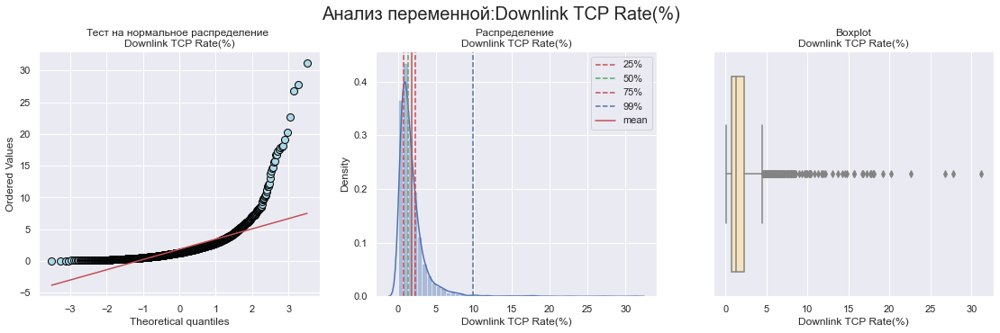

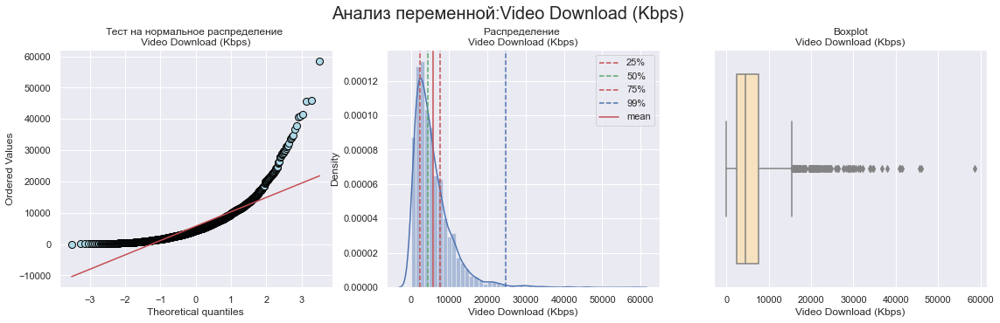

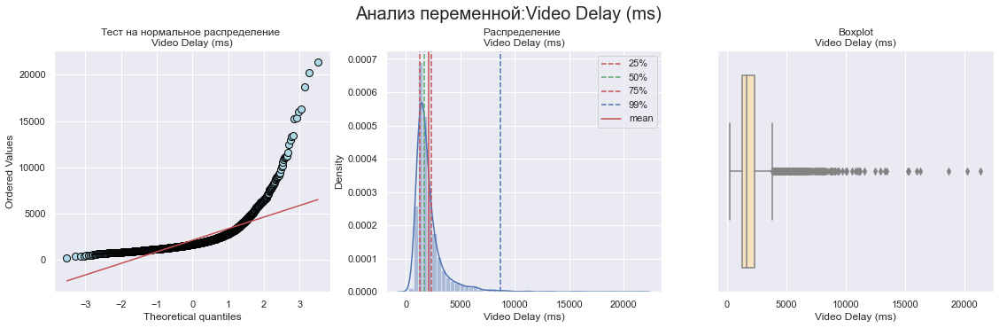

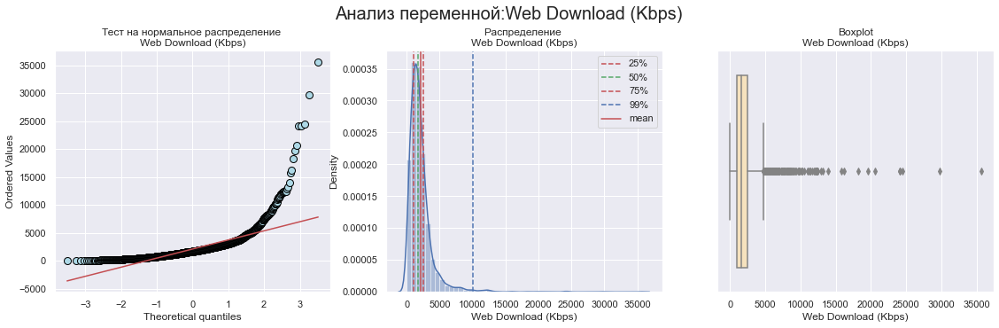

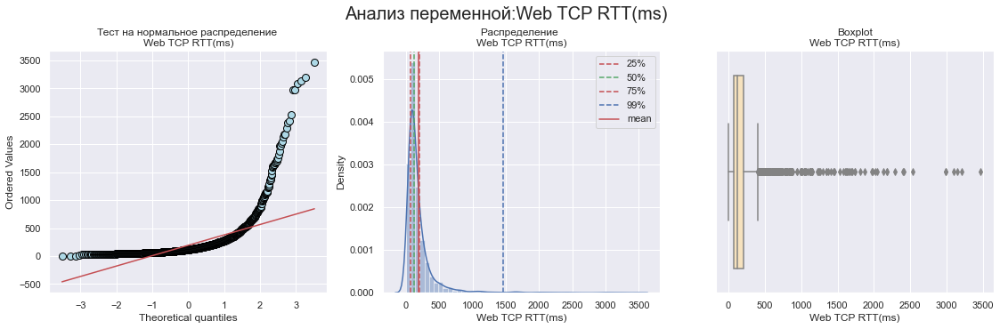

In [50]:
# ПРОВЕРКА ИСХОДНЫХ ДАННЫХ на "нормальность" и вид распределения
sns.set()
for item in list(data_all[lst_second]):
    my.data_visual(data_all[lst_second],item, 50)

__ВЫВОД:__
- Все распределения не соотвествуют нормальному согласно теста Шапиро(p_value меньше порога значимости) и qq_plot;
- За исключение Total (MB), все переменные содержат большое количество выбросов ( за 99 процентилем);
- Большое количество выбросов искажает значение среднего для данных переменных.

В данных содержатся ответы на вопросы , которые не удалось распознать (классифицировать).<br>
Данный вид ответа по шкале 1-10 отмечен как __0__ (Q1_res).

In [51]:
data_all['Q1_res'].value_counts()
# unrecognized

10    851
1     538
3     328
8     291
9     239
5     238
7     200
2     170
4     124
6     101
0      30
Name: Q1_res, dtype: int64

Удалим нераспознанные данные из нашего анализа.

In [52]:
#сохранение нераспознанных
data_unrecognized =data_all.query('Q1_res == 0')
# фильтрация распознанных
data_all = data_all.query('Q1_res != 0')
data_all.shape

(3080, 19)

Посмотрим на соотношение категориальных переменных по первому вопросу Q1

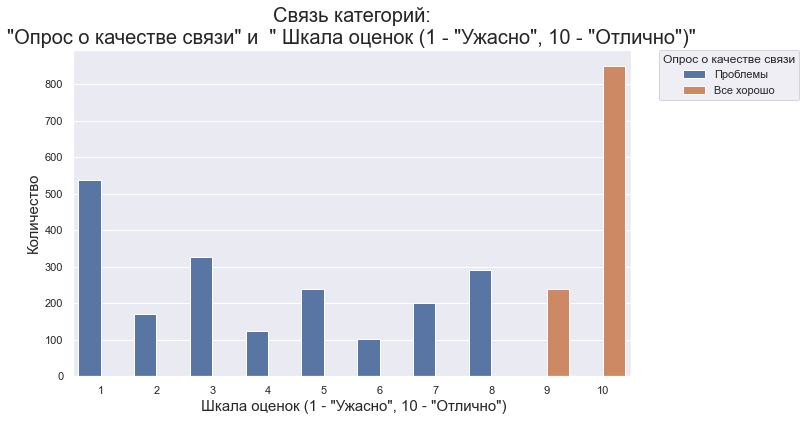

In [53]:
my.categor_pair(
                df= data_all,
                cat_main = 'Q1_cat',
                cat_x = 'Q1_res',
                name_main = 'Опрос о качестве связи',
                name_x = ' Шкала оценок (1 - "Ужасно", 10 - "Отлично")',
                lst_main=['Проблемы','Все хорошо'] )

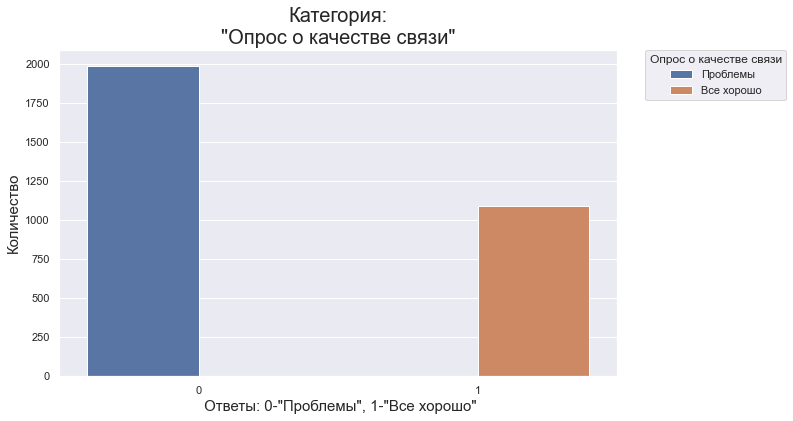

In [54]:
my.categor_pair(
                df= data_all,
                cat_main = 'Q1_cat',
                cat_x = 'Q1_cat',
                name_main = 'Опрос о качестве связи',
                name_x = ' Ответы: 0-"Проблемы", 1-"Все хорошо"',
                lst_main=['Проблемы','Все хорошо'],single=True )

__Вывод:__<br>


- Количество ответов "Проблемы" превышает почти в два раза количество ответов "Все хорошо";<br>
- Негативные ответы смещены по количеству в сторону низкой шкалы оценки т.е. их можно назвать ярко выраженными негативными.

Создадим списки ответов на второй вопрос  Q2

In [55]:
#классы
Q2_lst_1 =[1,2,3,4,5,6,7]
Q2_lst_1

[1, 2, 3, 4, 5, 6, 7]

In [56]:
# Переменные класса
Q2_lst_2 =[
            'Q2_1',
            'Q2_2',
            'Q2_3',
            'Q2_4',
            'Q2_5',
            'Q2_6',
            'Q2_7',
         ]
Q2_lst_2

['Q2_1', 'Q2_2', 'Q2_3', 'Q2_4', 'Q2_5', 'Q2_6', 'Q2_7']

In [57]:
# Информация о классах
Q2_lst_info =[
            '1.Недозвоны, обрывы при звонках',
            '2.Время ожидания гудков при звонке',
            '3.Плохое качество связи в зданиях, торговых центрах и тп',
            '4.Медленный мобильный Интернет',
            '5.Медленная загрузка видео',
            '6.Затрудняюсь ответить',
            '7.Свой вариант',
         ]
Q2_lst_info

['1.Недозвоны, обрывы при звонках',
 '2.Время ожидания гудков при звонке',
 '3.Плохое качество связи в зданиях, торговых центрах и тп',
 '4.Медленный мобильный Интернет',
 '5.Медленная загрузка видео',
 '6.Затрудняюсь ответить',
 '7.Свой вариант']

Посмотрим на вторую часть опроса о качестве связи Q2, в которой пользователи, давшие отрицательную оценку называют причины.

In [58]:
#сведем варианты ответа в один датафрейм
Q2_df = pd.DataFrame(data_all.iloc[:,11:18].sum()).reset_index().rename(columns={0:'n'})
Q2_df = pd.concat([Q2_df, pd.Series(Q2_lst_info)], axis= 1 ).rename(columns={0:'info'})
Q2_df = pd.concat([Q2_df, pd.Series(Q2_lst_1)], axis= 1 ).rename(columns={0:'cls'}).sort_values('n',ascending=False)

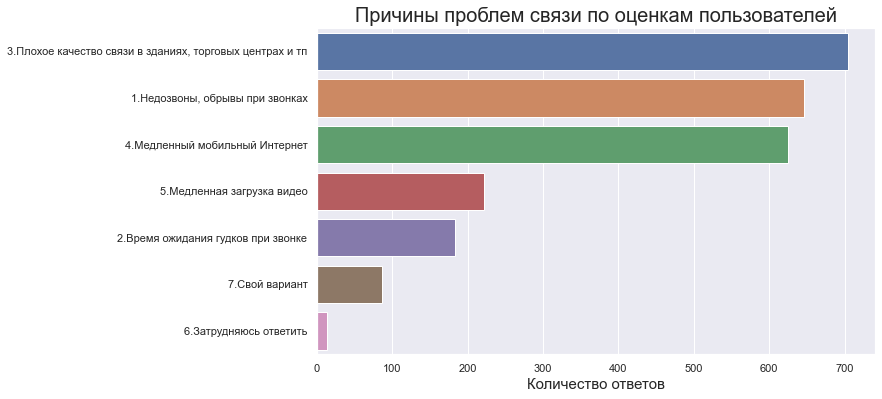

In [59]:
# Ответы Q2 по видам
# Q2_df = pd.DataFrame(data_all.iloc[:,11:17].sum())
sns.set()
plt.figure(figsize = (10,6))
g = sns.barplot(data = Q2_df,y='info', x ='n')
plt.title('Причины проблем связи по оценкам пользователей', fontsize = 20)
plt.xlabel("Количество ответов", fontsize = 15)
plt.ylabel('', fontsize = 15)
plt.show()

__ВЫВОД__<br>

С большим отрывом, почти с равнозначным результатом лидируют причины:<br>
- '3.Плохое качество связи в зданиях, торговых центрах и тп';<br>
- '1.Недозвоны, обрывы при звонках';<br>
- '4.Медленный мобильный Интернет'.<br>

__Это можно расценить , как самые существенные раздражители для пользователей__


Выделим выбросы в наших данных.<br>
Проведем разметку выбросов в данных по следующему принципу:<br>
- для каждой переменной определим  значения выбросов;<br>
- по всем переменным найдем пересечение наблюдений с выбросами, которые и отметим как аномальные наблюдения.<br>

Построим график зависимости количественных величин с отмеченными выбросами.


In [60]:
# новые выбросы !!!
# Процедура определения выбросов по квантилям
def outliers_MinMaxQantile(data,var_lst,key, min_p = 0, max_p = 99, ):
    """
    data        входной фрейм
    var_lst     спискок столбцов являющихся переменными с выбросами (Х)
    key         ключ уникальности строки (наблюдение)
    min_p       нижняя граница выбросов ( от 0 до 100)
    max_p       верхняя граница выбросов (от 0 до 100)
    """
    res = data.copy()
    X = res[var_lst]
    s=set([])
    for col in list(X):
        s = s | set(res[(res[col] < np.percentile(res[col],min_p)) \
             | (res[col] > np.percentile(res[col],max_p))][key])

    #  по умолчанию все отнесем к нормальным
    res['outliers']=0
    # значения с выбросами
    ind_outl = res[res[key].isin(list(s))]
    # переопределим как выбросы
    res.loc[ind_outl.index, 'outliers']= 1
    print("Количество выбросов:",(res['outliers']== (1)).sum())
    return res

In [61]:
# выберем переменные с выбросами согласно графиков распределения
select_outliers =    [
                      # 'Total (MB)',
                     'Downlink (Kbps)',
                     'Uplink (Kbps)',
                     'Downlink TCP Rate(%)',
                     'Video Download (Kbps)',
                     'Video Delay (ms)',
                     'Web Download (Kbps)',
                     'Web TCP RTT(ms)']


In [62]:
# разметка
data_all = outliers_MinMaxQantile(data_all,
                                          select_outliers,
                                           'user_id',
                                           max_p= 99.2)



Количество выбросов: 161


In [63]:
#отбор данных
select = lst_second.copy()
select.append('outliers')

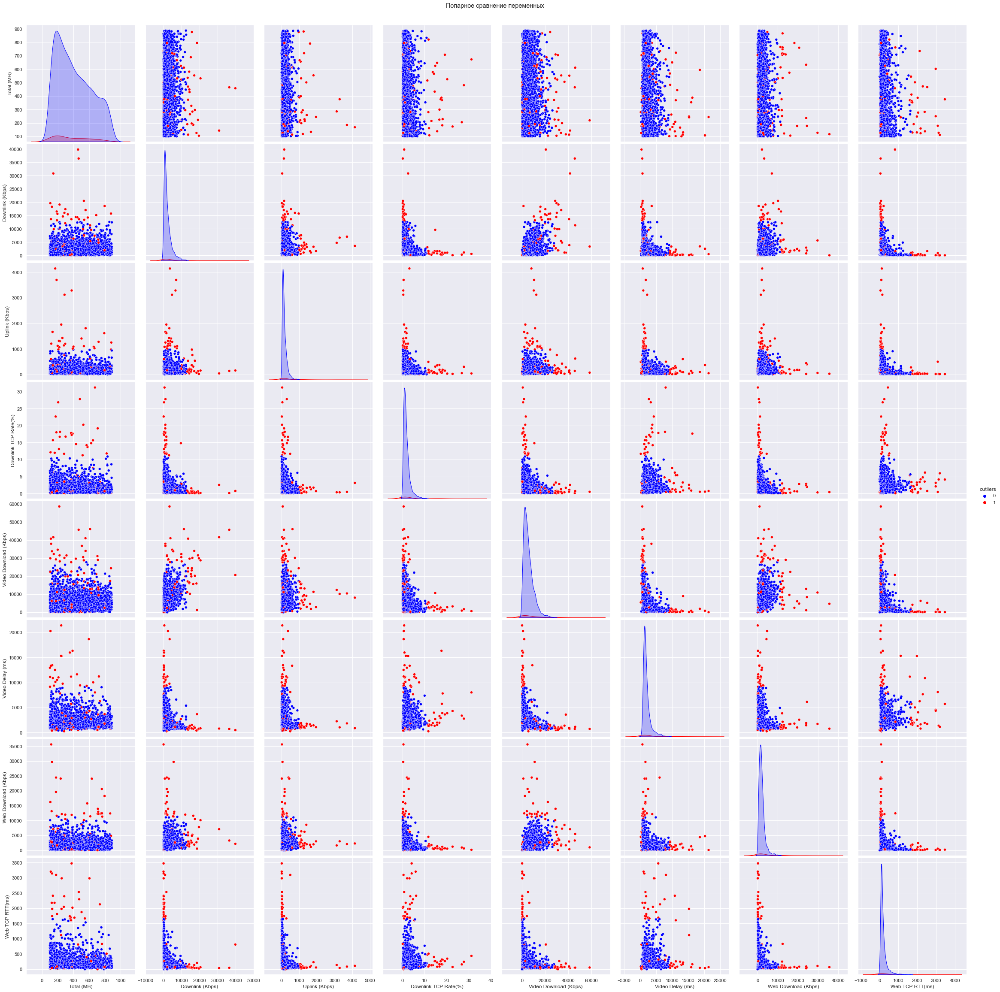

In [64]:
#Построим график зависимости количественных величин с отмеченными выбросами

g = sns.pairplot(data_all[select], hue ='outliers',
             corner=False, height= 4, palette=['blue','red'])
g.fig.suptitle("Попарное сравнение переменных", y=1.01)
plt.show()

__ВЫВОД__<br>

Разметка выбросов выглядит достаточно корректной.<br>
Попарное сравнение переменных на графиках не выявило сильно выраженных зависимостей.

Оценим корреляцию между переменными.

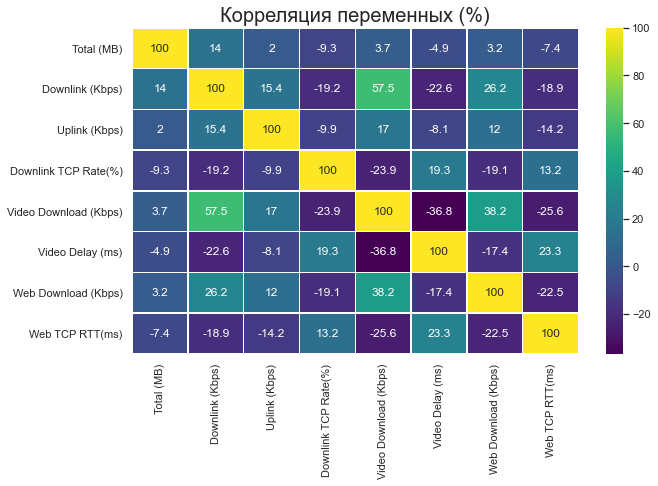

In [65]:
plt.figure(figsize = (10,6))
sns.heatmap((data_all[lst_second].corr()*100).round(1),annot=True,cmap='viridis', linewidths=0.5, fmt='g')
plt.title('Корреляция переменных (%)', fontsize = 20)
plt.show()

__ВЫВОД__<br>

Выявлена только одна средняя зависимость (57.5%) между  переменными Downlink (Kbps) и Video Download (Kbps).<br>
Связь совершенно логична, так как обе величины характеризуют скорость загрузки информации пользователем.

Проверим как повлияет удаление выбросов из нашего набора данных на пропорции ответов пользователей.

In [66]:
# Посмотрим доли отзывов Q1-cat в исходных данных
resume = data_all['Q1_cat'].value_counts()
print('Доля ответов в исходных данных:\n Ответов ''"0"'' {} доля {}% \n Ответов ''"1"'' {} доля {}%'. \
          format(resume[0],  round(resume[0]/resume.sum(),2)*100 ,
                  resume[1],round(resume[1]/resume.sum(),2)*100 ))

# Посмотрим отзывы в выбросах
resume = data_all[data_all['outliers']  == 1]['Q1_cat'].value_counts()

print('Доля ответов в выбросах:\n Ответов ''"0"'' {} доля {}% \n Ответов ''"1"'' {} доля {}%'. \
          format(resume[0],  round(resume[0]/resume.sum(),2)*100 ,
                  resume[1],round(resume[1]/resume.sum(),2)*100 ))

# Посмотрим отзывы в без выбросов
resume = data_all[data_all['outliers']  == 0]['Q1_cat'].value_counts()

print('Доля ответов без выбросов:\n Ответов ''"0"'' {} доля {}% \n Ответов ''"1"'' {} доля {}%'. \
          format(resume[0],  round(resume[0]/resume.sum(),2)*100 ,
                  resume[1],round(resume[1]/resume.sum(),2)*100 ))

Доля ответов в исходных данных:
 Ответов "0" 1990 доля 65.0% 
 Ответов "1" 1090 доля 35.0%
Доля ответов в выбросах:
 Ответов "0" 107 доля 66.0% 
 Ответов "1" 54 доля 34.0%
Доля ответов без выбросов:
 Ответов "0" 1883 доля 65.0% 
 Ответов "1" 1036 доля 35.0%


__Вывод:__<br>

 Для снижения влияния выбросов на основные характеристики параметров связи убираем выбросы при дальнейшем анализе.

In [67]:
# выделили данные без выбросов
data_all_trim  = data_all.query('outliers == 0')
data_all_trim.shape

(2919, 20)

Посмотрим на распределения данных после удаления выбросов

Шапиро-тест переменной Total (MB):
 ShapiroResult(statistic=0.9366819262504578, pvalue=1.4224363265712796e-33)
Шапиро-тест переменной Downlink (Kbps):
 ShapiroResult(statistic=0.795339047908783, pvalue=0.0)
Шапиро-тест переменной Uplink (Kbps):
 ShapiroResult(statistic=0.8049651980400085, pvalue=0.0)
Шапиро-тест переменной Downlink TCP Rate(%):
 ShapiroResult(statistic=0.8006774187088013, pvalue=0.0)
Шапиро-тест переменной Video Download (Kbps):
 ShapiroResult(statistic=0.8772576451301575, pvalue=3.60133705331478e-43)
Шапиро-тест переменной Video Delay (ms):
 ShapiroResult(statistic=0.7554922699928284, pvalue=0.0)
Шапиро-тест переменной Web Download (Kbps):
 ShapiroResult(statistic=0.8257408142089844, pvalue=0.0)
Шапиро-тест переменной Web TCP RTT(ms):
 ShapiroResult(statistic=0.6434436440467834, pvalue=0.0)


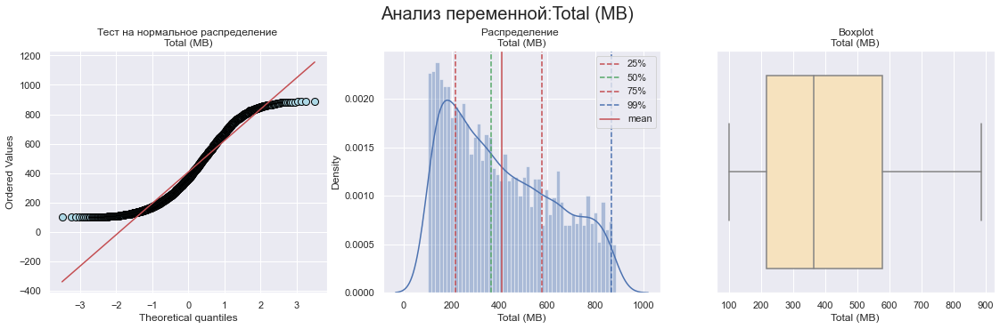

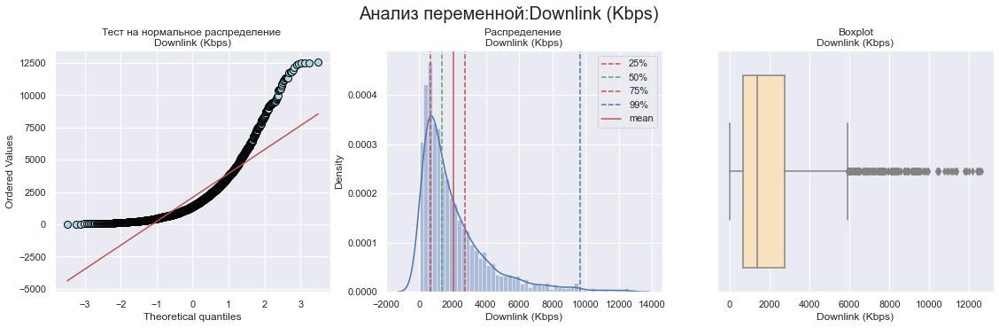

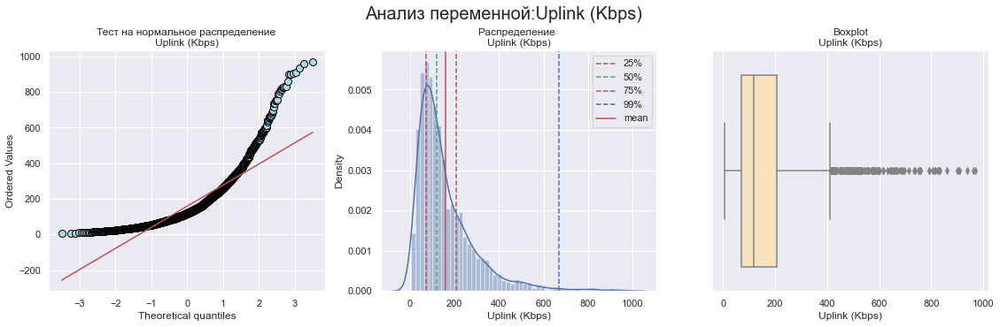

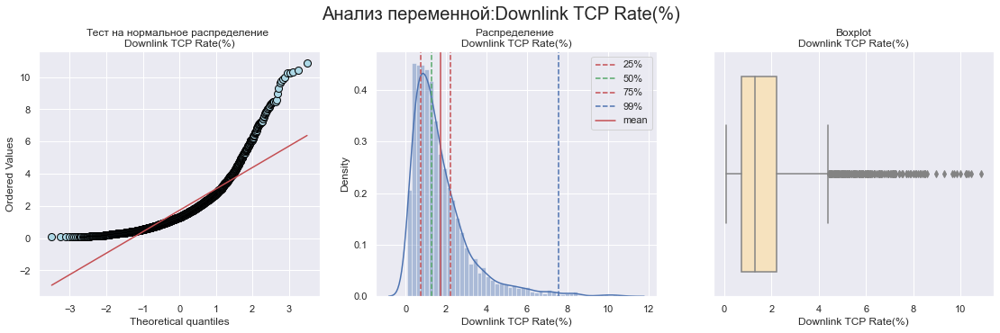

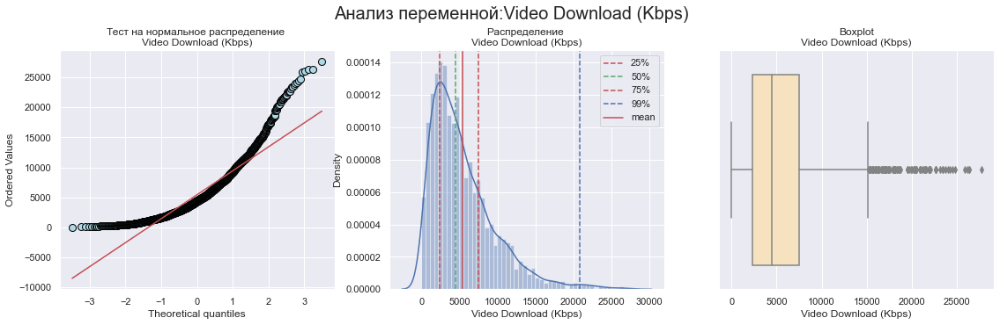

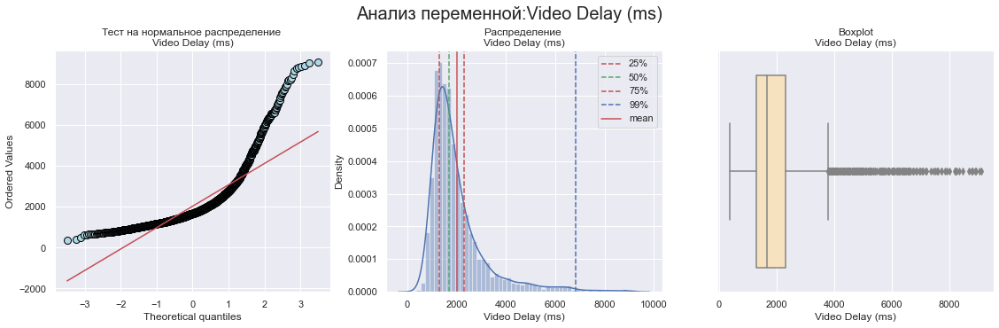

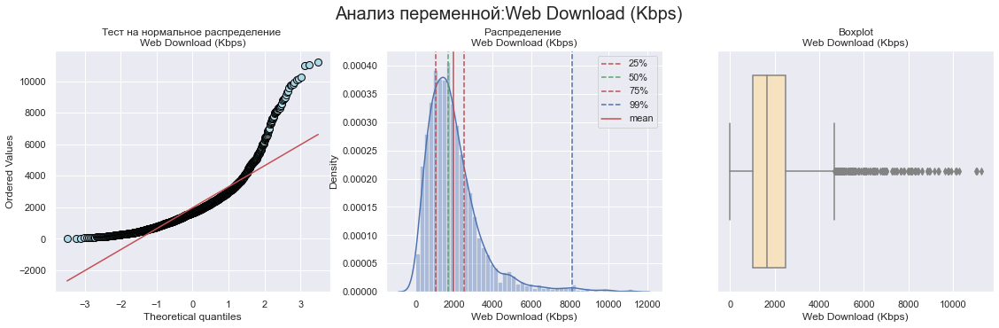

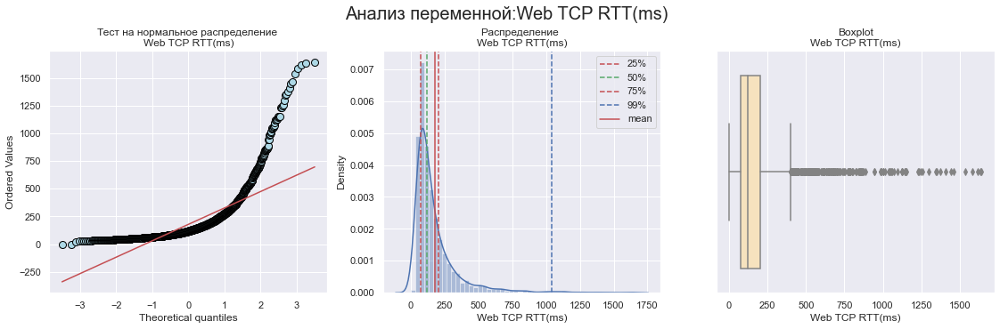

In [68]:
#Посмотрим на данные при удалении выбросов

for item in list(data_all_trim[lst_second]):
    my.data_visual(data_all_trim[lst_second],item, 50)

__ВЫВОД__<br>

- Распределения стали более "информативными";<br>
- Средняя величина скорректировала свое значение.<br>

Можно приступать к проверке статистически гипотез.



# 3.Проверка гипотез
[Top](#Диплом)

По результатам ответов на первый вопрос о качестве связи сформировалось два класса пользователей (Q1_cat):<br>
- 0 - "Существуют проблемы с качеством связи" (далее для краткости "Проблемы");<br>
- 1 - "С качеством связи все хорошо" (далее для краткости "Все хорошо").<br>
Каждому классу соотвествуют свои значения параметров связи. Считаю, что при ответе на вопрос о качестве связи пользователи руководствовались субъективными ощущениями.<br>
Pазницы в объективных параметрах связи между классами пользователей нет.<br>
Проверим  нулевую гипотезу <br>__H_0 : (параметры связи группы "Проблемы") = (параметры связи группы "Все хорошо")__<br>

В качестве тестовых статистик рассмотрим разницы средних величин и разницы медиан по каждому параметру связи.<br>
Тестирование будем проводить методом bootstrap так как распределение параметров связи не относится к нормальным , а выбранный метод не треюует этого ограничения.

Проведем сравнение групп по средней величине.

In [69]:
# Проведем анализ разницы средних параметров связи для групп абонетов
# удолетворенных качеством связи (1) и нет (0)
res_mean_Q1 = my.package_bootstrap(
                                    a1 = data_all_trim.query('Q1_cat == 1'),
                                    a2 = data_all_trim.query('Q1_cat == 0'),
                                    boot_it= 2000,
                                    column_list = lst_second,
                                    )
res_mean_Q1

Total (MB)

Downlink (Kbps)

Uplink (Kbps)

Downlink TCP Rate(%)

Video Download (Kbps)

Video Delay (ms)

Web Download (Kbps)

Web TCP RTT(ms)



,Significant Result,st_name,confidence level,quants_level,a1,a2,TST_diff_a1_a2,Conf_Int,"(H0: a1 = a2), p_value","(H0: a1 > a2), p_value","(H0: a1 < a2), p_value"
Total (MB),0,mean,0.95,"[0.025, 0.975]",400.169,412.222,-12.0534,"[-26.38222, 2.22714]",0.0894675,0.0447338,0.955266
Downlink (Kbps),1,mean,0.95,"[0.025, 0.975]",2323.16,1945.83,377.331,"[243.28708, 504.15135]",2.27686e-08,1,1.13843e-08
Uplink (Kbps),1,mean,0.95,"[0.025, 0.975]",167.721,154.487,13.2341,"[4.64427, 21.67589]",0.00216725,0.998916,0.00108362
Downlink TCP Rate(%),1,mean,0.95,"[0.025, 0.975]",1.55478,1.82383,-0.269056,"[-0.36198, -0.17525]",2.03245e-08,1.01623e-08,1
Video Download (Kbps),1,mean,0.95,"[0.025, 0.975]",5925.66,5195.16,730.504,"[450.23554, 1003.13613]",1.20201e-07,1,6.01007e-08
Video Delay (ms),1,mean,0.95,"[0.025, 0.975]",1862.13,2118.87,-256.742,"[-333.86536, -180.2161]",2.26475e-11,1.13238e-11,1
Web Download (Kbps),1,mean,0.95,"[0.025, 0.975]",2176.97,1867.29,309.685,"[218.63996, 399.95281]",5.71592e-11,1,2.85796e-11
Web TCP RTT(ms),1,mean,0.95,"[0.025, 0.975]",160.786,189.046,-28.2605,"[-40.18998, -16.85009]",1.85401e-06,9.27006e-07,0.999999


В таблице  приведены результаты тестирования, где a1 - группа "Все хорошо", а2 - группа "Проблемы".<br>
__ВЫВОДЫ__<br>
- Оснований отвергать гипотезу  __Н_0__  для параметра _Total (MB)_ нет (статистически значимых различий по группам нет);<br>
- все параметры кроме _Total (MB)_ имеют значения p_value существенно ниже уровня значимости, что отвергает гипотезу о равенстве и
позволяет утверждать с уверенностью 95% о статистически значимых различиях тестируемых параметров между группами.

Проведем сравнение групп по медиане.

Total (MB)

Downlink (Kbps)

Uplink (Kbps)

Downlink TCP Rate(%)

Video Download (Kbps)

Video Delay (ms)

Web Download (Kbps)

Web TCP RTT(ms)



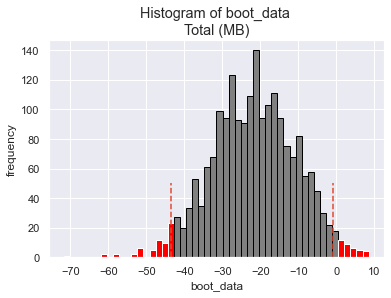

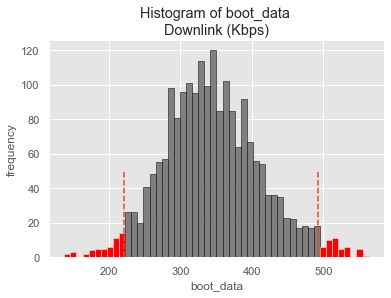

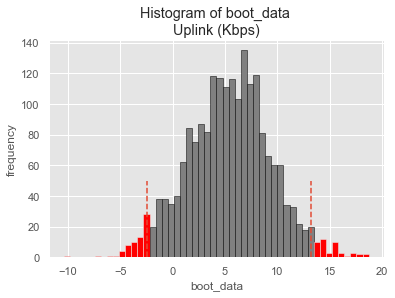

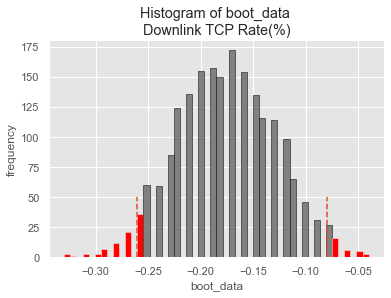

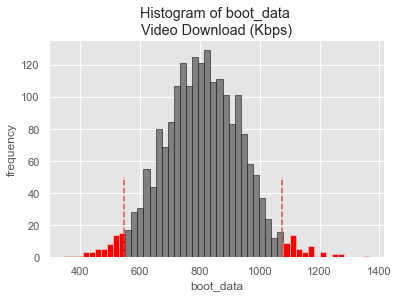

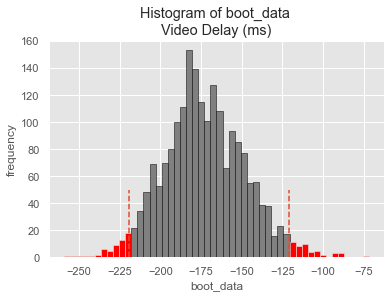

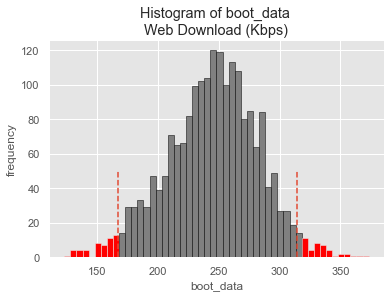

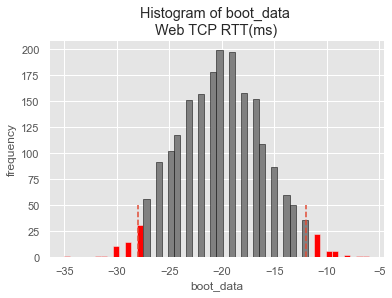

,Significant Result,st_name,confidence level,quants_level,a1,a2,TST_diff_a1_a2,Conf_Int,"(H0: a1 = a2), p_value","(H0: a1 > a2), p_value","(H0: a1 < a2), p_value"
Total (MB),1,median,0.95,"[0.025, 0.975]",351.557,372.303,-20.7463,"[-43.45686, -0.80854]",0.0499717,0.0249859,0.975014
Downlink (Kbps),1,median,0.95,"[0.025, 0.975]",1623.66,1279.38,344.275,"[221.627, 492.518]",3.36403e-07,1,1.68202e-07
Uplink (Kbps),0,median,0.95,"[0.025, 0.975]",123.16,116.83,6.33,"[-2.4535, 13.27275]",0.177355,0.911322,0.0886777
Downlink TCP Rate(%),1,median,0.95,"[0.025, 0.975]",1.2,1.37,-0.17,"[-0.26025, -0.08]",0.000194458,9.7229e-05,0.999903
Video Download (Kbps),1,median,0.95,"[0.025, 0.975]",4915.78,4100.4,815.38,"[548.21875, 1073.10575]",1.35173e-09,1,6.75866e-10
Video Delay (ms),1,median,0.95,"[0.025, 0.975]",1555,1729,-174,"[-219.0, -121.0]",3.69034e-12,1.84517e-12,1
Web Download (Kbps),1,median,0.95,"[0.025, 0.975]",1829.49,1583.12,246.37,"[166.97775, 314.59075]",7.75519e-11,1,3.87759e-11
Web TCP RTT(ms),1,median,0.95,"[0.025, 0.975]",107,127,-20,"[-28.0, -12.0]",1.18661e-06,5.93307e-07,0.999999


In [70]:
# Проведем анализ разницы медиан для групп абонетов (вариант с визуализацией распределения данных bootstrap)
# с учетом формы распределения параметров медиана может лучше отражать центральную тенденцию в выборках
res_median_Q1 = my.package_bootstrap(
                                     a1 = data_all_trim.query('Q1_cat == 1'),
                                     a2 = data_all_trim.query('Q1_cat == 0'),
                                     boot_it = 2000,
                                     column_list = lst_second,
                                     st = np.median,
                                     visual = True
                                     )

res_median_Q1

В таблице  приведены результаты тестирования, гду a1 - группа "Все хорошо", а2 - группа "Проблемы".<br>
__ВЫВОДЫ__<br>
- Оснований отвергать гипотезу  __Н_0__  для параметров _Total (MB)_  и _Uplink (Kbps)_ нет (статистически значимых различий по группам нет);<br>
- все параметры кроме _Total (MB)_ и _Uplink (Kbps)_ имеют значения p_value существенно ниже уровня значимости, что отвергает гипотезу о равенстве и
позволяет утверждать с уверенностью 95% о статистически значимых различиях тестируемых параметров между группами.

Сопоставим результаты тестирования по средним и медианам, и сравним распределения параметров по группам.

In [71]:
# Сопоставим оценки разниц медиан и средних
res_mean_Q1_review = res_mean_Q1[['st_name','Significant Result','Conf_Int',
             'a1','a2','TST_diff_a1_a2']]
res_median_Q1_review = res_median_Q1[['st_name','Significant Result','Conf_Int',
             'a1','a2','TST_diff_a1_a2']]
res_mean_median = pd.concat([res_mean_Q1_review,res_median_Q1_review]).sort_index(ascending = True)
res_mean_median['Diff_%_to_a2'] = (res_mean_median['TST_diff_a1_a2'] / res_mean_median['a2']) * 100
res_mean_median

,st_name,Significant Result,Conf_Int,a1,a2,TST_diff_a1_a2,Diff_%_to_a2
Downlink (Kbps),mean,1,"[243.28708, 504.15135]",2323.16,1945.83,377.331,19.3918
Downlink (Kbps),median,1,"[221.627, 492.518]",1623.66,1279.38,344.275,26.9095
Downlink TCP Rate(%),mean,1,"[-0.36198, -0.17525]",1.55478,1.82383,-0.269056,-14.7522
Downlink TCP Rate(%),median,1,"[-0.26025, -0.08]",1.2,1.37,-0.17,-12.4088
Total (MB),mean,0,"[-26.38222, 2.22714]",400.169,412.222,-12.0534,-2.924
Total (MB),median,1,"[-43.45686, -0.80854]",351.557,372.303,-20.7463,-5.57242
Uplink (Kbps),mean,1,"[4.64427, 21.67589]",167.721,154.487,13.2341,8.56647
Uplink (Kbps),median,0,"[-2.4535, 13.27275]",123.16,116.83,6.33,5.41813
Video Delay (ms),mean,1,"[-333.86536, -180.2161]",1862.13,2118.87,-256.742,-12.117
Video Delay (ms),median,1,"[-219.0, -121.0]",1555,1729,-174,-10.0636


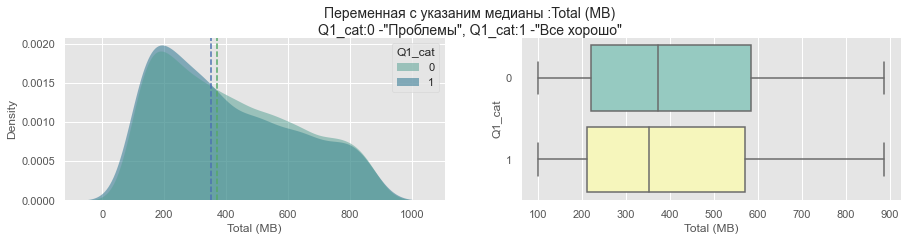

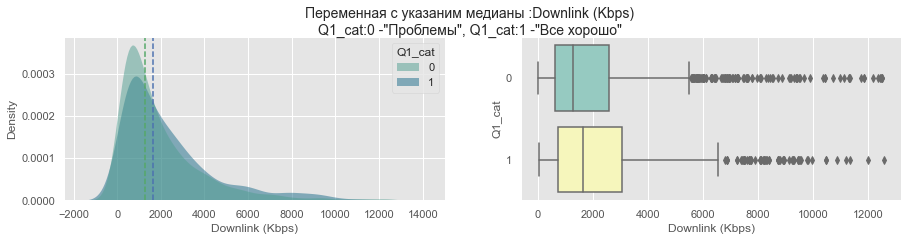

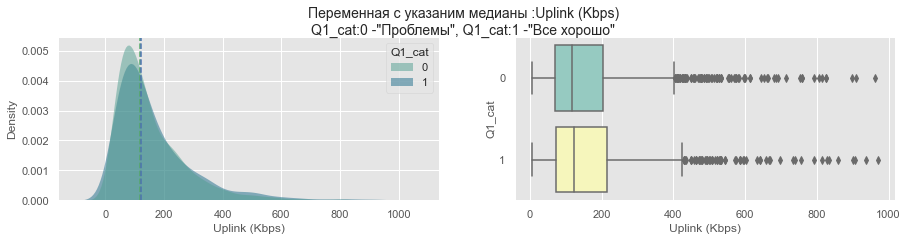

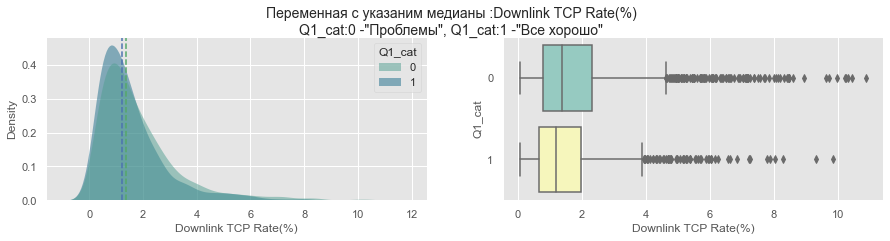

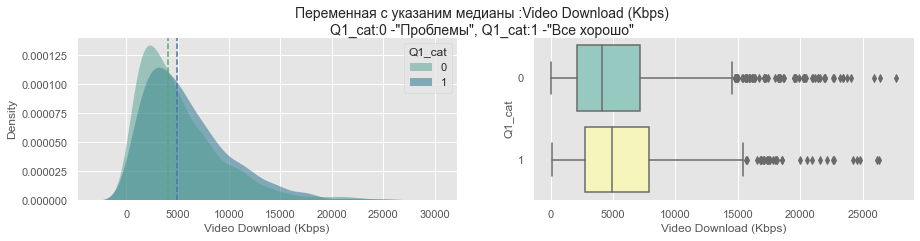

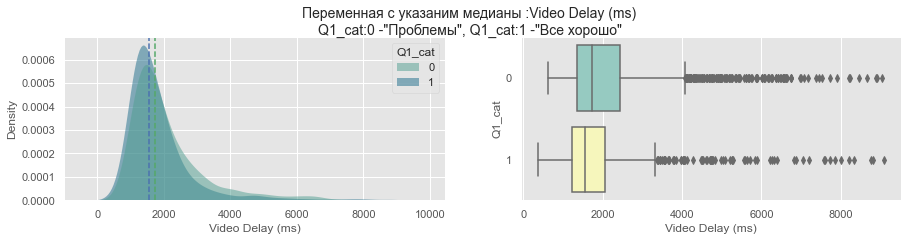

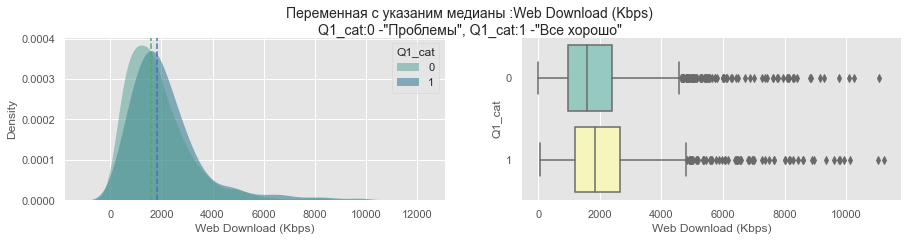

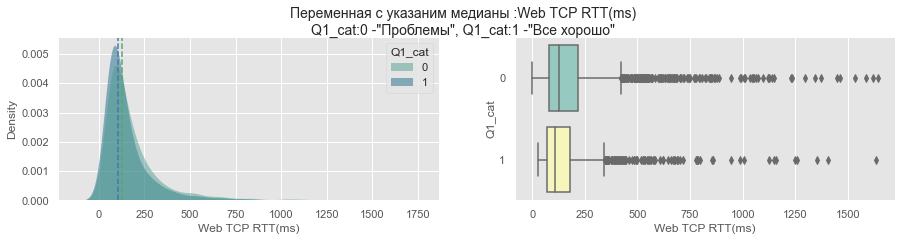

In [72]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'Q1_cat',
                cls_lst = [0,1],
                var_lst= lst_second,
                name1='Проблемы',
                name2='Все хорошо'
                )

__ВЫВОД__<br>
- Учитывая характер распределения исследуемых параметров медиана лучше описывает данные;<br>
- Параметры _'Total (MB)'_ и _'Uplink (Kbps)'_  не дают различий по сравниваемым группам пользователей;<br>
- Параметры _'Downlink (Kbps)'_, _'Downlink TCP Rate(%)'_, _'Video Download (Kbps)'_, _'Video Delay (ms)'_, _'Web Download (Kbps)'_, _'Web TCP RTT(ms)'_ дают статистически значимые различия в группах;<br>
- Полученные различия не носят яркий характер при сравнении распределений параметров, что указывает на проблемы классификации данных по группам.

Приоритет при сравнении параметров качества связи по группам  за __медианой__

__Представим на графике значимые парамеры качества связи по влиянию на оценку пользователей__

In [73]:
# отбираем значимые  переменные(фичи) по медиане
main_features = res_mean_median[(res_mean_median['Significant Result'] == 1)
& (res_mean_median['st_name'] == 'median')]
main_features['weight'] = abs(main_features['Diff_%_to_a2'])/100
main_features.sort_values('weight', ascending= False,inplace= True)
main_features

,st_name,Significant Result,Conf_Int,a1,a2,TST_diff_a1_a2,Diff_%_to_a2,weight
Downlink (Kbps),median,1,"[221.627, 492.518]",1623.66,1279.38,344.275,26.9095,0.269095
Video Download (Kbps),median,1,"[548.21875, 1073.10575]",4915.78,4100.4,815.38,19.8854,0.198854
Web TCP RTT(ms),median,1,"[-28.0, -12.0]",107,127,-20,-15.748,0.15748
Web Download (Kbps),median,1,"[166.97775, 314.59075]",1829.49,1583.12,246.37,15.5623,0.155623
Downlink TCP Rate(%),median,1,"[-0.26025, -0.08]",1.2,1.37,-0.17,-12.4088,0.124088
Video Delay (ms),median,1,"[-219.0, -121.0]",1555,1729,-174,-10.0636,0.100636
Total (MB),median,1,"[-43.45686, -0.80854]",351.557,372.303,-20.7463,-5.57242,0.0557242


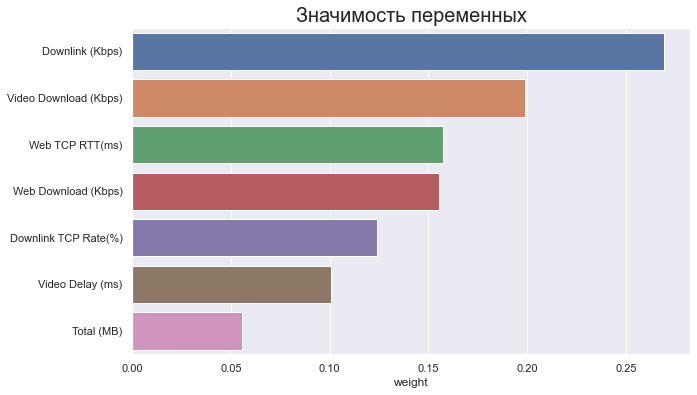

In [74]:
# Построим график значимости параметров связи

sns.set()
plt.figure(figsize = (10,6))
sns.barplot(x = main_features['weight'], y = main_features.index)
plt.title("Значимость перeменных", fontsize = 20)
plt.show()

# 4.Оценка возможности классификации
[Top](#Диплом)

Предположим, что на основе значимых переменных(параметров связи) и ответов пользователей о качестве связи ("Проблемы", "Все хорошо") можно построить модель.<br>
Модель будет определять классы пользователей по входным параметрам связи.<br>
Оценим возможности классификации по входным параметрам, для этого построим графики показывающий соотношение переменой по классам.

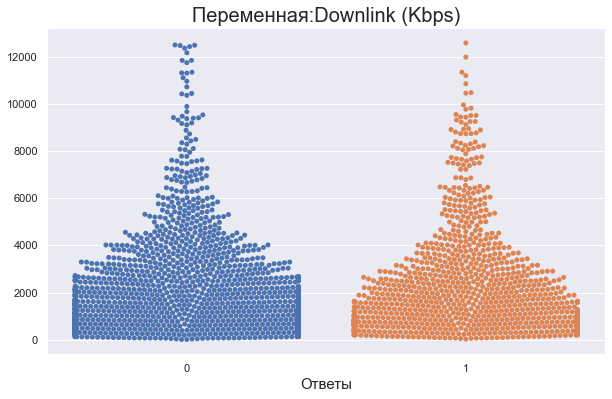

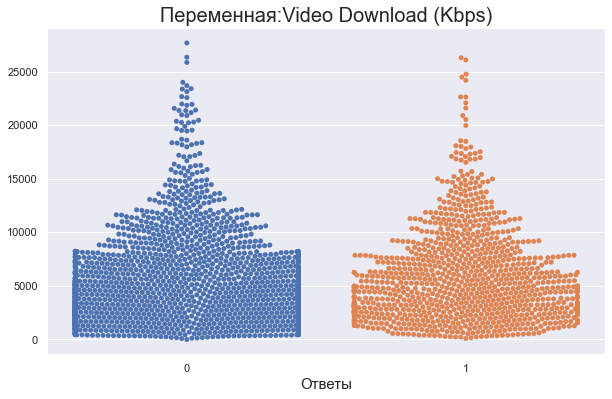

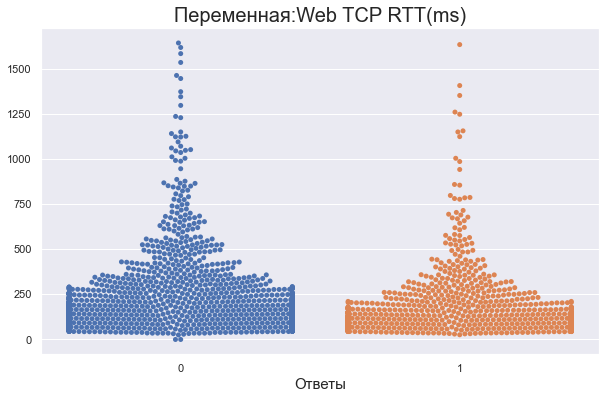

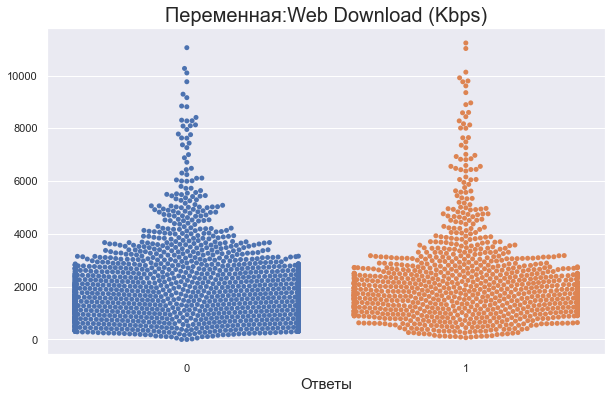

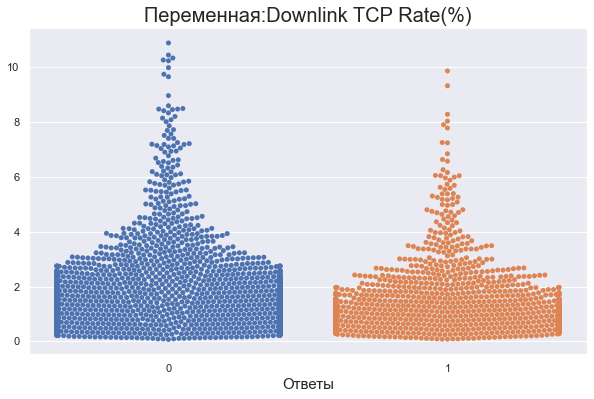

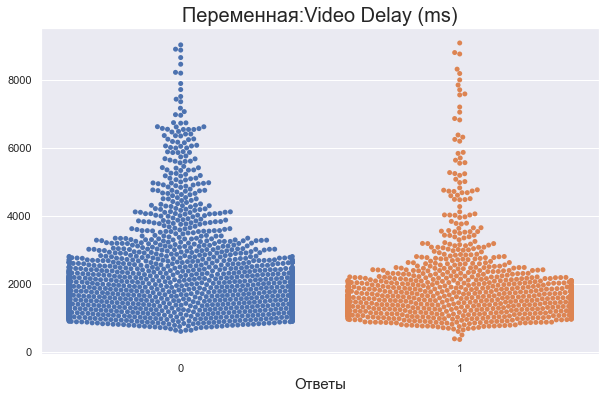

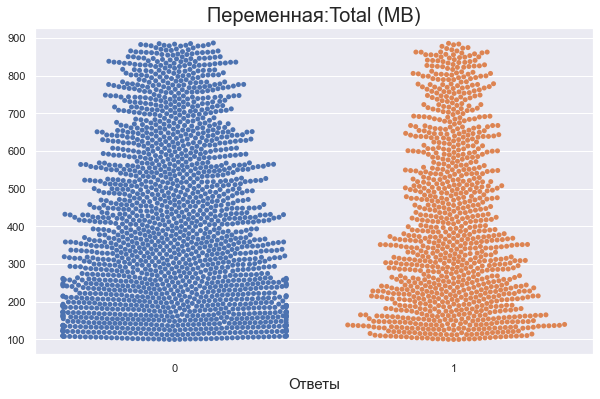

In [75]:
# Оценим значимые переменные на возможность классификации по качеству связи
# для этого построим графики

for item in list(main_features.index):
    sns.set()
    plt.figure(figsize = (10,6))
    sns.swarmplot( x="Q1_cat",y =item, data=data_all_trim)
    plt.title('Переменная:'+item, fontsize = 20)
    plt.xlabel("Ответы", fontsize = 15)
    plt.ylabel("")
    plt.show()

__ВЫВОД__ <br>
Все  рассмотренные переменные практически не имеют явного разделения по классу ответа и содержат слабую информацию для построения классификации

Проведем нормализацию переменных для получения __профиля__  для каждого класса(Q1_cat)переменной.<br>
Посторим график с профилем каждого класса пользователя.

In [76]:
#Формирование данных
X_data,y_data = data_all_trim[lst_second], data_all_trim['Q1_cat']

In [77]:
# Нормализуем данные для графика (диапазон от 0 до 1)
X_std = (X_data- X_data.min(axis=0)) / (X_data.max(axis=0) - X_data.min(axis=0))
# Удалим заведомо не информативный  Общий трафик (Total (MB)
X_std.drop('Total (MB)', axis = 1, inplace = True)
#  добавим признак классификации
X_std = pd.concat([X_std, y_data], axis=1)
# данные по классам ответов пользователей
X_0 = X_std.query('Q1_cat == 0').drop(['Q1_cat'], axis = 1)
X_1 = X_std.query('Q1_cat == 1').drop(['Q1_cat'], axis = 1)

In [78]:
# определим макс радиус радара для медианы
up_limit = round(max([X_0.median().max(),X_1.median().max()]),4)

In [79]:
#Построение граифка
radar_median = my.radar_visual('median',
                           X_0, X_1,
                          'Проблемы','Все хорошо',
                           up_limit,
                           inf = ' ("Все хорошо" и "Проблемы")' )

In [80]:
# Достаем из словаря параметры
radar_median_0 = radar_median['Проблемы'].rename(columns ={'r':'Проблемы'})
radar_median_1 = radar_median['Все хорошо'].rename(columns ={'r':'Все хорошо'})

In [81]:
radar_median=pd.concat([radar_median_0,radar_median_1[['Все хорошо']]], axis = 1)
radar_median['diff_%']=(radar_median['Все хорошо'] - radar_median['Проблемы'])/ radar_median['Проблемы']*100
radar_median['weight'] = abs(radar_median['diff_%'])/100
radar_median.sort_values('weight', ascending= False,inplace= True)
radar_median

,feature,Проблемы,Все хорошо,diff_%,weight
0,Downlink (Kbps),0.100745,0.128138,27.191340,0.271913
3,Video Download (Kbps),0.148070,0.177515,19.885377,0.198854
6,Web TCP RTT(ms),0.077298,0.065125,-15.748031,0.157480
5,Web Download (Kbps),0.140886,0.162811,15.562307,0.155623
2,Downlink TCP Rate(%),0.120259,0.104533,-13.076923,0.130769
4,Video Delay (ms),0.155311,0.135352,-12.850812,0.128508
1,Uplink (Kbps),0.114768,0.121329,5.717124,0.057171


__ВЫВОД__<br>
- Существующие различия в профилях групп пользователей дают __возможность классификации__;<br>
- Фактические различия имею маленькие значения, что отрицательно скажется на __качестве классификации__.

# 5.Классификация
[Top](#Диплом)

Построим базовый классификатор, оценим качество модели по _"субъективной"_ (по результатам опроса) разметке данных.<br>
В качестве классификатора выберем __Random Forest__ и его реализацию в Sklearn.

Проведем обучение и классификацию

<Figure size 720x864 with 0 Axes>

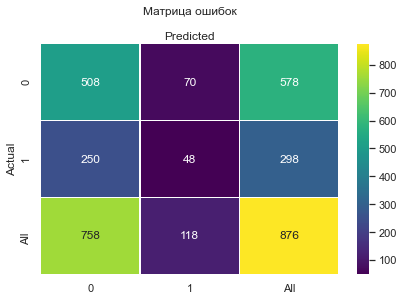

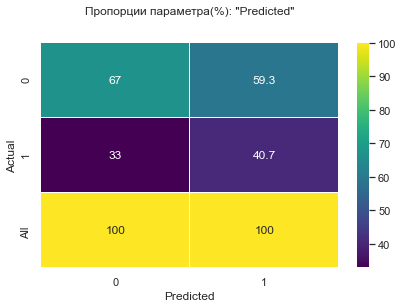

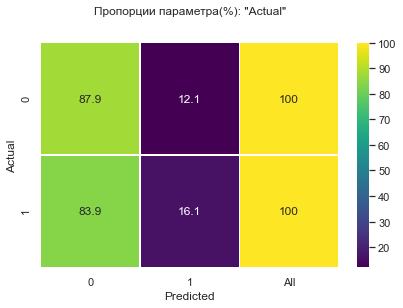

classification_report:
               precision    recall  f1-score   support

           0       0.67      0.88      0.76       578
           1       0.41      0.16      0.23       298

    accuracy                           0.63       876
   macro avg       0.54      0.52      0.50       876
weighted avg       0.58      0.63      0.58       876

roc_auc_score: 0.52


In [82]:
#Базовый класификатор для оценки модели
from sklearn.model_selection import train_test_split
from sklearn.ensemble import  RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

X_data, y_data = data_all_trim[lst_second], data_all_trim['Q1_cat']
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=.3, random_state=0)
# clf = RandomForestClassifier(n_estimators=250, random_state=42, n_jobs=-1)
clf = RandomForestClassifier(n_estimators=250,
                             random_state=42,
                             max_features= 2,
                             n_jobs=-1)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

df_confusion = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)
# Визуализирем матрицу ошибок
my.class_describe(df= df_confusion,
                  name_y='Actual',
                  name_x='Predicted',
                  name_title='Матрица ошибок')
# качество модели
print('classification_report:\n',classification_report(y_test, y_pred))
print('roc_auc_score:',round(roc_auc_score(y_test, y_pred),2))

__ВЫВОД__<br>
Качество классификации не устраивает.<br>
Разметка данных сделанная на основе __субъективной__ оценки не соотвествует __объективным__ характеристикам качества связи.

#### Новая разметка данных
Используя входные переменные качества связи и целевую переменную Q1_cat(0_"Проблемы", 1-"Все хорошо"), проведем переразметку данных.<br>


Исходные данные разобьём на N частей с равным распределением объектов из 0-го и 1-го классов.
На каждых (N-1) частях обучим __несколько методов__ машинного обучения,разных по архитектуре и предсказывающих вероятность.<br>

In [83]:
# Модели "комитета" который произведет новую разметку

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier

clfs = {}

logreg_model = LogisticRegression(C=100)
clfs['LogReg'] = {'clf': LogisticRegression(), 'name':'LogisticRegression', 'model': logreg_model}

rf_model = RandomForestClassifier(n_estimators=250, max_depth=18, n_jobs=-1)
clfs['RandomForest'] = {'clf': RandomForestClassifier(), 'name':'RandomForest', 'model': rf_model}

nb_model = GaussianNB()
clfs['NB'] = {'clf': GaussianNB(), 'name':'GaussianNB', 'model': nb_model}

knn_model = KNeighborsClassifier(n_neighbors = 20)
clfs['kNN'] = {'clf': KNeighborsClassifier(), 'name': 'KNeighborsClassifier', 'model': knn_model}

ada_model = AdaBoostClassifier(n_estimators=100, random_state=0)
clfs['AdaBoost'] = {'clf': AdaBoostClassifier(), 'name': 'AdaBoostClassifier', 'model': ada_model}
#Перечень моделей
print('Комитет моделей:')
for item in clfs:
    print(item,clfs[item])

Комитет моделей:
LogReg {'clf': LogisticRegression(), 'name': 'LogisticRegression', 'model': LogisticRegression(C=100)}
RandomForest {'clf': RandomForestClassifier(), 'name': 'RandomForest', 'model': RandomForestClassifier(max_depth=18, n_estimators=250, n_jobs=-1)}
NB {'clf': GaussianNB(), 'name': 'GaussianNB', 'model': GaussianNB()}
kNN {'clf': KNeighborsClassifier(), 'name': 'KNeighborsClassifier', 'model': KNeighborsClassifier(n_neighbors=20)}
AdaBoost {'clf': AdaBoostClassifier(), 'name': 'AdaBoostClassifier', 'model': AdaBoostClassifier(n_estimators=100, random_state=0)}


Исходные данные разбиваем на 5 частей с равномерным распределением примеров 0-го и 1-го классов.

In [84]:
# Подготовка данных для новой разметки Комитетом

data_0 = np.array_split(data_all_trim[data_all_trim['Q1_cat'] == 0].sample(frac=1), 5)
data_1 = np.array_split(data_all_trim[data_all_trim['Q1_cat'] == 1].sample(frac=1), 5)

dfs = {i: data_0[i].append(data_1[i]) for i in range(5)}
#Набор данных
print('Подготовлен набор данных:')
for item in dfs:
    print(item,dfs[item].shape)

Подготовлен набор данных:
0 (585, 20)
1 (584, 20)
2 (584, 20)
3 (583, 20)
4 (583, 20)


Производим переразметку данных, итерируясь по каждой из 5-и частей выборки и
используя для прогнозирования каждую из 5-и вышеобъявленных моделей.

In [85]:
# процедура получения новой разметки
from sklearn.preprocessing import  StandardScaler

def remaping_data(
                  dfs,
                  clfs,
                  var_lst = lst_second,
                  target = 'y',
                  threshold = 0.5,
                  vote = True
                  ):
    '''
    vote    true голосование комитета иначе единогласно
    threshold порог значимости
    dfs словарь с наборами данных для моделей
    var_lst  список столбцов  переменных
    target   колонка с целевой переменной
    clfs  словарь с перечнем моделей для комитета

    '''
    relabeled_data = pd.DataFrame()
    for i in range(5):
        # test - i-й dataframe, train - все оставшиеся кроме i-го
        df_test = dfs[i]
        df_train = pd.concat([value for key, value in dfs.items() if key != i])
        X_train, y_train = df_train[var_lst], df_train[target]
        X_test, y_test = df_test[var_lst], df_test[target]

        df_w_predicts = df_test.copy()
        # обучение каждой модели на train и прогноз на test
        for value in clfs.values():
            model = value['model']
            if value['name'] in ['LogisticRegression', 'GaussianNB']:
                model.fit(StandardScaler().fit_transform(X_train), y_train)
                predicts = (model.predict_proba(StandardScaler().fit_transform(X_test)
                                               )[:, 1] >= threshold).astype(bool)
            else:
                model.fit(X_train, y_train)
                predicts = (model.predict_proba(X_test)[:, 1] >= threshold).astype(bool)

            df_w_predicts[value['name']] = predicts
        relabeled_data = relabeled_data.append(df_w_predicts) #

    ### Новое разбиение на классы
    relabeled_data['threshold'] = threshold
    # голосование комитета
    if vote: # большинство голосов
        relabeled_data['Q1_new'] = (((relabeled_data['LogisticRegression'].astype(int) + \
                          relabeled_data['RandomForest'].astype(int) + \
                          relabeled_data['GaussianNB'].astype(int) + \
                          relabeled_data['KNeighborsClassifier'].astype(int) + \
                          relabeled_data['AdaBoostClassifier'].astype(int)) >=3).astype(bool)).astype(int)
    else: # если единогласно
        relabeled_data['Q1_new'] = relabeled_data['LogisticRegression'] & \
                          relabeled_data['RandomForest'].astype(int) &\
                          relabeled_data['GaussianNB'].astype(int) & \
                          relabeled_data['KNeighborsClassifier'] & \
                          relabeled_data['AdaBoostClassifier']
    return relabeled_data

In [86]:
# переразметим наши данные посмотрим результат
data_all_trim= remaping_data(
                                dfs,
                                clfs,
                                var_lst = lst_second,
                                target = 'Q1_cat',
                                threshold = 0.5,
                                vote=True
                             )
data_all_trim.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2919 entries, 838 to 1580
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Q1_res                 2919 non-null   int64  
 1   Q1_cat                 2919 non-null   int64  
 2   user_id                2919 non-null   int64  
 3   Total (MB)             2919 non-null   float64
 4   Downlink (Kbps)        2919 non-null   float64
 5   Uplink (Kbps)          2919 non-null   float64
 6   Downlink TCP Rate(%)   2919 non-null   float64
 7   Video Download (Kbps)  2919 non-null   float64
 8   Video Delay (ms)       2919 non-null   int64  
 9   Web Download (Kbps)    2919 non-null   float64
 10  Web TCP RTT(ms)        2919 non-null   int64  
 11  Q2_1                   2919 non-null   int64  
 12  Q2_2                   2919 non-null   int64  
 13  Q2_3                   2919 non-null   int64  
 14  Q2_4                   2919 non-null   int64  
 15  Q2

Проведем исследование влияния измененеия порога вероятности при классификации.<br>
Посмотрим на количественные изменения в самой классификации и изменения статистических параметров
переменных в каждом классе в зависимости от порога.


In [87]:
#Процедура для проведения исследования
def remaping_research(
                      selection,
                      dfs,
                      clfs,
                      var_lst = [],
                      target = 'Q1_cat',
                      target_new = 'Q1_new',
                      stat = 'mean',
                      low = 45,
                      up = 52,
                      vote = True
                      ):
    '''
    selection отбор колонок
    low  нижний порог
    up   верхний опрог
    stat = 'mean' значение статистики для сравнения
    dfs словарь с наборами данных для моделей
    var_lst  список столбцов  переменных
    target   колонка с целевой переменной
    target_new новая классификация
    clfs  словарь с перечнем моделей для комитета
    '''
    lst = list([x / 100.0 for x in range(low, up+1, 1)])
    res = pd.DataFrame()
    res_class =pd.DataFrame()
    step = 1
    step_all = len(lst)
    for i in lst:
        relabeled_data = remaping_data(
                                        dfs,
                                        clfs,
                                        var_lst = var_lst,
                                        target = target,
                                        threshold = i,
                                        vote = vote )
        # сравнение средних при переопределении
        old = relabeled_data.groupby(target).agg(stat)[selection].T.rename(columns={0:'cls_0_old',1:'cls_1_old'})
        new = relabeled_data.groupby(target_new).agg(stat)[selection].T.rename(columns={0:'cls_0_new',1:'cls_1_new'})
        old_new = pd.concat([old, new], axis=1)
        res = pd.concat([res,old_new.T], axis= 0 )
        print('Шаг {} из {} порог классификации {}'.format (step, step_all, i))
        # Количество по классам
        y_1_new = pd.DataFrame(relabeled_data[relabeled_data[target] == 1][target_new].value_counts()).\
                        rename(columns={target_new:'cls_1_old'}).T
        # y_1_new = pd.DataFrame(relabeled_data.query(" y == 1")['y_new'].value_counts()).\
        #                 rename(columns={'y_new':'cls_1_old'}).T
        y_0_new = pd.DataFrame(relabeled_data[relabeled_data[target] == 0][target_new].value_counts()).\
                        rename(columns={target_new:'cls_0_old'}).T
        # y_0_new = pd.DataFrame(relabeled_data.query(" y == 0")['y_new'].value_counts()).\
        #                 rename(columns={'y_new':'cls_0_old'}).T
        y_new_sum = pd.DataFrame(relabeled_data[target_new].value_counts()).\
                        rename(columns={target_new:'cls_sum'}).T
        class_count = pd.concat([y_0_new, y_1_new,y_new_sum ], axis = 0).rename(columns={0:'cls_0_new', 1:'cls_1_new'})
        class_count['cls_sum'] = class_count['cls_0_new'] + class_count['cls_1_new']
        class_count['threshold']  = i
        res_class = pd.concat([res_class,class_count],axis=0)

        step += 1


    return res, res_class # исследование переменных и количества в классах соотвественно

In [88]:
# фильтр информации для исследования
selection = lst_second.copy()
selection.append('threshold')

Проведем оценку медианы переменных в связи с изменением порогов классификации

In [89]:
# исследование  переменных по изменению параметра средней величины
res, class_count = remaping_research(
                      selection, # фильтр данных
                      dfs, # данные
                      clfs, # модели комитета
                      var_lst = lst_second,
                      target = 'Q1_cat',
                      target_new = 'Q1_new',
                      stat = 'median', # исследуемая статистика
                      low = 40, # нижний порог
                      up = 52, # верхний порог  вероятности
                      vote= True
                      )

Шаг 1 из 13 порог классификации 0.4
Шаг 2 из 13 порог классификации 0.41
Шаг 3 из 13 порог классификации 0.42
Шаг 4 из 13 порог классификации 0.43
Шаг 5 из 13 порог классификации 0.44
Шаг 6 из 13 порог классификации 0.45
Шаг 7 из 13 порог классификации 0.46
Шаг 8 из 13 порог классификации 0.47
Шаг 9 из 13 порог классификации 0.48
Шаг 10 из 13 порог классификации 0.49
Шаг 11 из 13 порог классификации 0.5
Шаг 12 из 13 порог классификации 0.51
Шаг 13 из 13 порог классификации 0.52


In [90]:
# Процедура построения графиков для исследования переменных

def threshold_var_grapg(
                        res, # данные
                        lst_var , # список переменных
                        st_name = 'mean' # имя параметра для исследования
                        ):

    res_graph = res.reset_index()
    # Построим графики зависимости от разметки

    sns.set_theme(style="ticks")

    for item in lst_var:
        g = sns.lmplot(x="threshold", y=item, col='index', hue='index', data=res_graph,
                   col_wrap=2, ci=None, palette="muted", height=4,
                   scatter_kws={"s": 50, "alpha": 1}, )
        g.fig.subplots_adjust(top=0.85)
        g.fig.suptitle('Зависимость (' +st_name +') переменной '+ '"'+ item +'"'+ '\n' +'от порога классификации' ,
                       fontsize=16)

In [91]:
# процедуреа построения графика связи количеств элементов класса с порогом классификации
def threshold_count_cls_graph( class_count):

    res_graph = class_count.reset_index()
    # Построим графики зависимости от разметки

    sns.set_theme(style="ticks")

    for item in list(class_count.drop('threshold',axis = 1)):
        g = sns.lmplot(x="threshold", y=item, col='index', hue='index', data=res_graph,
                   col_wrap=3, ci=None, palette="muted", height=4,
                   scatter_kws={"s": 50, "alpha": 1}, )
        g.fig.subplots_adjust(top=0.7)
        g.fig.suptitle('Зависимость количества объектов '+ '"'+ item +'"'+ \
                       '\n' +'от порога классификации', fontsize=16)

Посмотрим на графики изменения количества наблюдений по классам при изменении порога классификации

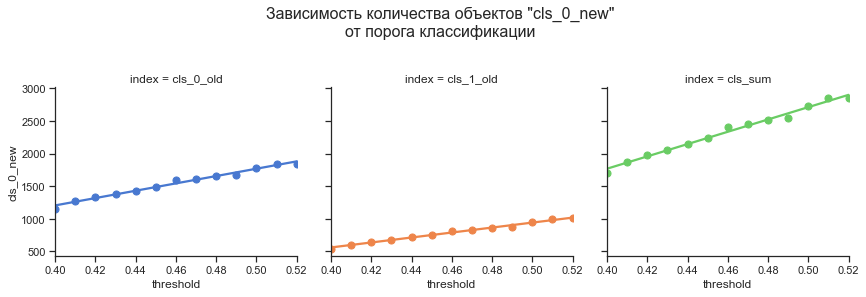

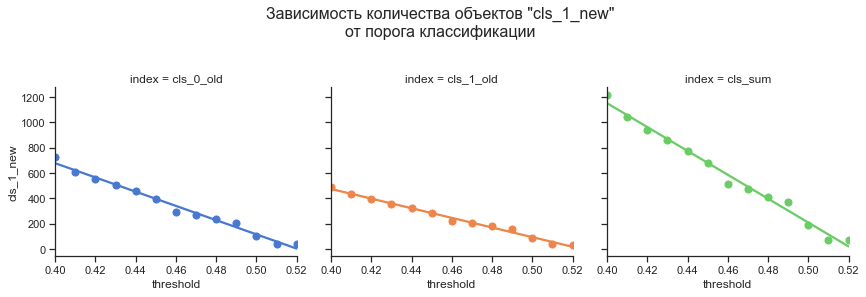

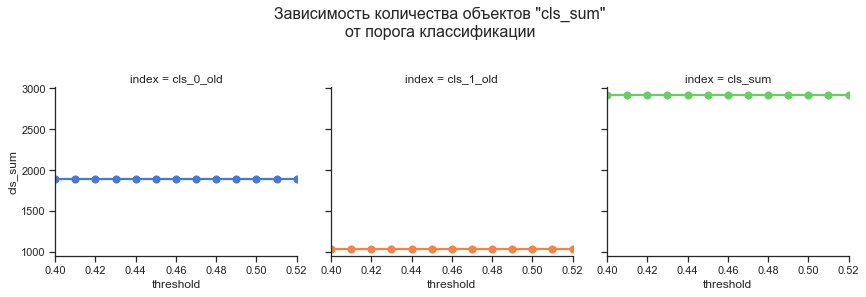

In [92]:
# Строим график для количества по классам
threshold_count_cls_graph( class_count)


__Вывод__<br>
- выявлена линейная зависимость в изменении количества элементов в классе от порога классификации;
- оснований изменить порог классификации с __0.5__ нет.

Построим графики изменения медиан переменных при изменении порога классификации**

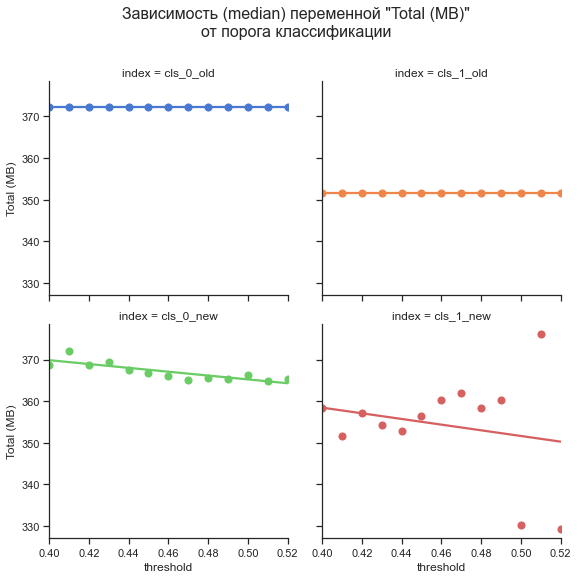

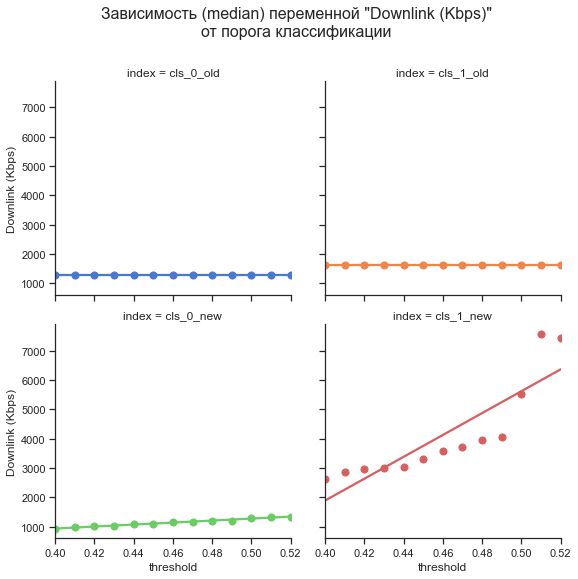

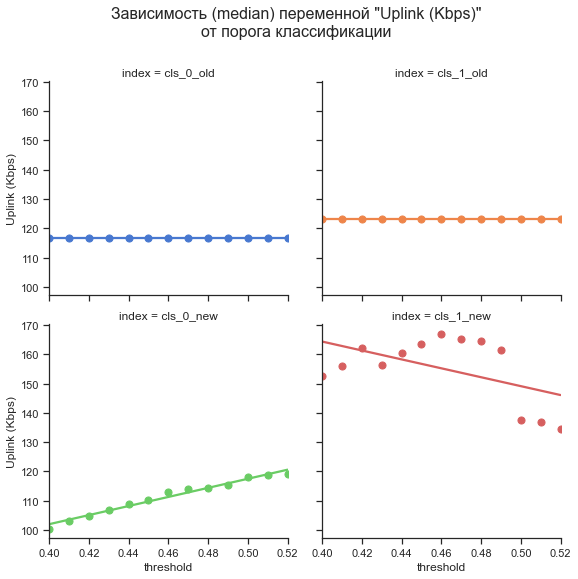

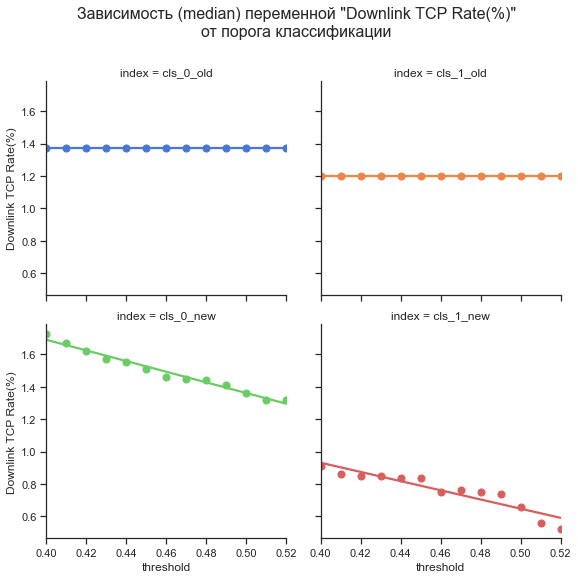

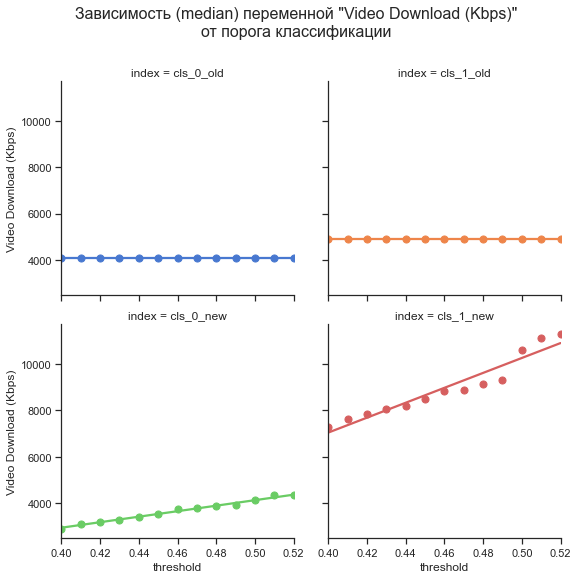

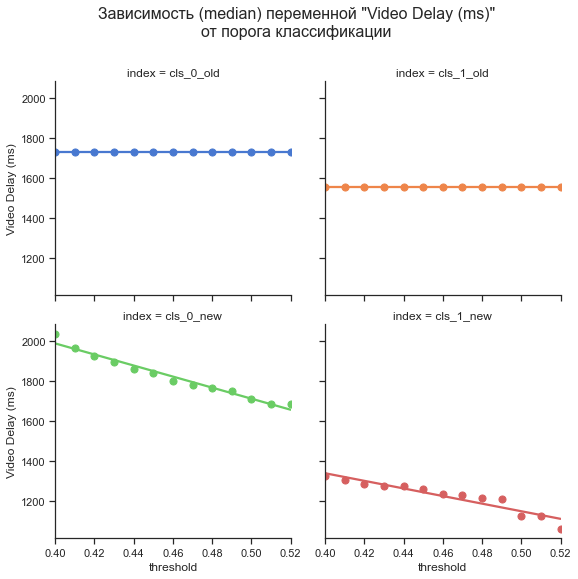

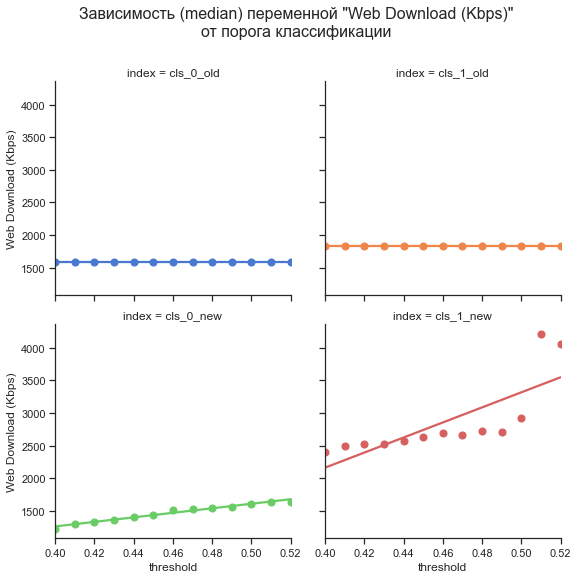

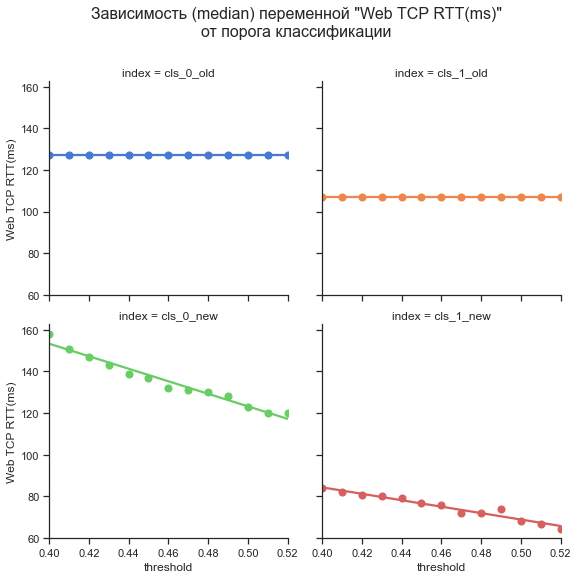

In [93]:
# строим график для переменных
threshold_var_grapg(
                        res,
                        lst_var = list(X_test),
                        st_name = 'median'
                    )

__Вывод__ <br>
- Для переменных _Total (MB)_ и _Uplink (Kbps)_ в классе cls_1_new (что соотвествует "Все хорошо" в новой классификации)
выявлено нелинейное поведение. Но эти переменные не имеют статистически значимых разниц в группах, а значит  не формируют признаки для классификации;<br>
- Все остальные переменные показали четкую связь с изменением порога классификации;<br>
- Оснований изменить порог классификации с __0.5__ нет.



Исследование связи старой (Q1_cat) и новой (Q1_new) классификации

In [94]:
# связь классов новых и старых
# print('Связь между классами при пороге значимости классификации {}'.format(0.50))
cls_old_to_new = class_count.query('threshold == 0.50')
cls_old_to_new = cls_old_to_new.drop('threshold', axis=1)

<Figure size 720x864 with 0 Axes>

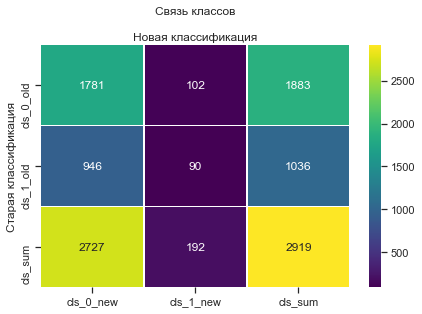

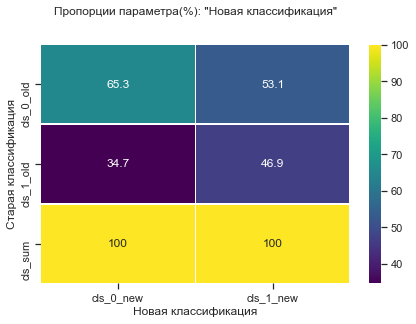

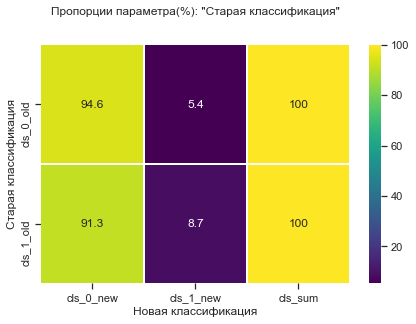

In [95]:
# описание классов
my.class_describe(df =cls_old_to_new,
                  name_y='Старая классификация',
                  name_x='Новая классификация',
                  name_title='Связь классов')

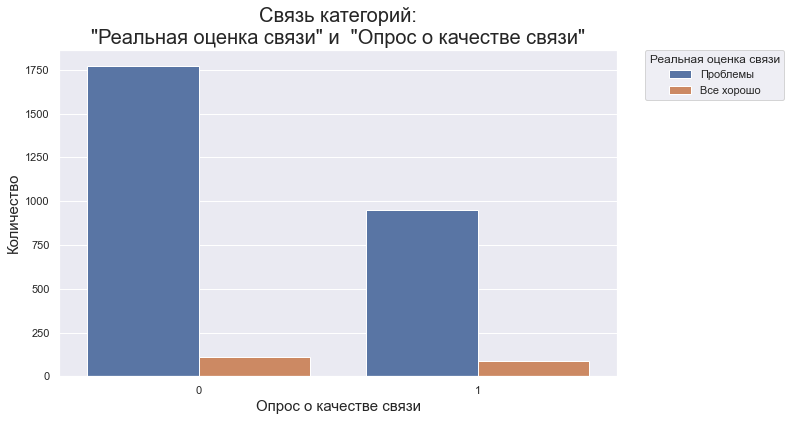

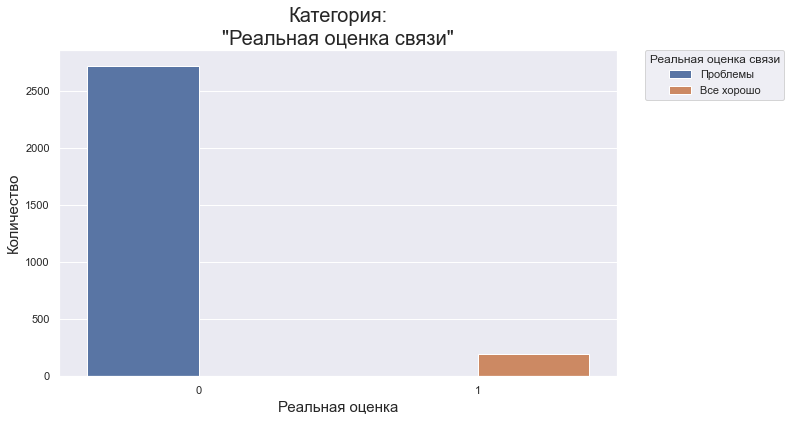

In [96]:
my.categor_pair(
                df = data_all_trim,
                cat_main='Q1_new',
                cat_x= 'Q1_cat',
                name_main='Реальная оценка связи',
                name_x='Опрос о качестве связи',
                lst_main=['Проблемы','Все хорошо']
                )
my.categor_pair(
                df = data_all_trim,
                cat_main='Q1_new',
                cat_x= 'Q1_new',
                name_main='Реальная оценка связи',
                name_x='Реальная оценка',
                lst_main=['Проблемы','Все хорошо'],
                single= True
                )

__ВЫВОД__<br>
Применяя термины оценки качества классификации опишем соотношения старой и новой классификации:<br>
- "Точность" новой классификации в отношении старой:<br>
    - класс 0 ("Проблемы") 65%;<br>
    - класс 1 ("Все хорошо") 47%;<br>
- "Охват" новой классификации в отношении старой:<br>
    - класс 0 ("Проблемы") 95%;<br>
    - класс 1 ("Все хорошо") 8%;<br>

Разница в оценках старой и новой классификации лежит в разных подходах:<br>
- старая классификация была дана на основе __субъективной__ оценки пользователя;<br>
- новая классификация формировалась на основании __объективных__ показателей качества связи.

МЕДИАНЫ переменных по классам при пороге значимости классификации __0.5__

In [97]:
res.query('threshold == 0.5').T.iloc[: -1, :]

,cls_0_old,cls_1_old,cls_0_new,cls_1_new
Total (MB),372.3033,351.55701,366.29304,330.12446
Downlink (Kbps),1279.3800,1623.65500,1285.42000,5526.86500
Uplink (Kbps),116.8300,123.16000,118.04000,137.64000
Downlink TCP Rate(%),1.3700,1.20000,1.36000,0.66000
Video Download (Kbps),4100.4000,4915.78000,4125.98000,10620.75500
Video Delay (ms),1729.0000,1555.00000,1710.00000,1126.50000
Web Download (Kbps),1583.1200,1829.49000,1610.80000,2927.91500
Web TCP RTT(ms),127.0000,107.00000,123.00000,68.00000


### Новая разметка данных
На основании старой(субъективной) и новой(объективной) классификации оценки качества связи пользователями
проведем разметку пользователей по новым группам:<br>
- Q1_cat= 0 и Q1_new= 0  формирует класс __'0'__ - эти пользователи объективно указали проблемы качества связи("эксперты_0");<br>
- Q1_cat= 0 и Q1_new= 1  формирует класс __'1'__ - эти пользователи субъективно указали проблемы связи("пессимисты_1");<br>
- Q1_cat= 1 и Q1_new= 0  формирует класс __'2'__ - эти пользователи субъективно указали на отсутствие проблем("оптимисты_2");<br>
- Q1_cat= 1 и Q1_new= 1  формирует класс __'3'__ - эти пользователи объективно указали на отсутствие проблем("эксперты_3")

In [98]:
# проставим признак новой классификации в наших данных
# признак по правилу двоичного кода
data_all_trim['new_cls'] = data_all_trim['Q1_cat'] * 2 + data_all_trim['Q1_new']

In [99]:
data_all_trim.head()


,Q1_res,Q1_cat,user_id,Total (MB),Downlink (Kbps),Uplink (Kbps),Downlink TCP Rate(%),Video Download (Kbps),Video Delay (ms),Web Download (Kbps),...,Q2_all,outliers,LogisticRegression,RandomForest,GaussianNB,KNeighborsClassifier,AdaBoostClassifier,threshold,Q1_new,new_cls
838,8,0,769,122.83562,573.60,67.03,3.17,1690.89,2542,721.95,...,1,0,False,False,False,False,False,0.5,0,0
99,5,0,1301,568.17094,1453.72,98.87,1.67,4661.38,1300,286.57,...,2,0,False,False,False,False,False,0.5,0,0
1468,3,0,2372,370.50663,5736.36,176.78,0.95,5665.42,2179,1671.64,...,0,0,False,False,False,False,False,0.5,0,0
1448,3,0,2183,456.03804,6389.38,391.25,0.93,12051.13,1245,3327.47,...,0,0,False,False,True,False,False,0.5,0,0
1515,3,0,2849,387.36819,202.90,51.96,0.87,357.94,2568,478.21,...,3,0,False,False,False,False,False,0.5,0,0


# 6.Анализ новой классификации пользователей
[Top](#Диплом)

In [100]:
#создадим списки соотвествия классов для удобства работы
user_lst = [0,1,2,3]
user_info = ['эксперты_0','пессимисты_1','оптимисты_2','эксперты_3']

Посмотрим на количество пользователей по новой классификации

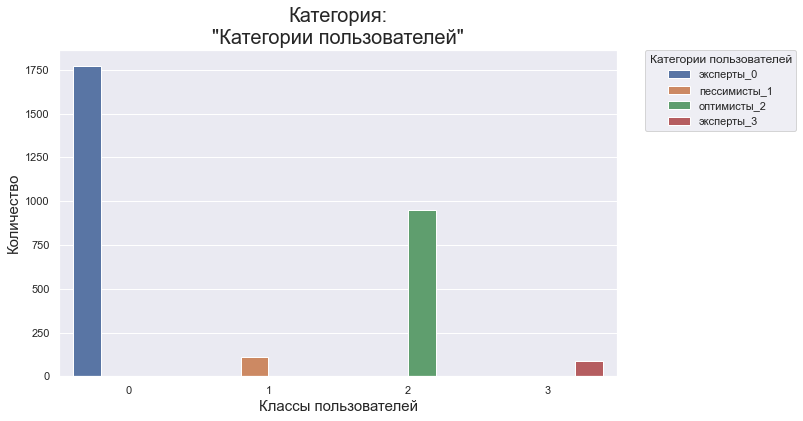

In [101]:
my.categor_pair(
                df = data_all_trim,
                cat_main='new_cls',
                cat_x= 'new_cls',
                name_main='Категории пользователей',
                name_x='Классы пользователей',
                lst_main=user_info,
                single=True
                )

__ВЫВОД__<br>
- Самые массовые категории 'эксперты_0' и 'оптимисты_2';<br>
- Самые малочисленые категории 'пессимисты_1' и 'эксперты_3'.

Рассмотрим соотношение субъективного опроса с категориями пользователей.

<Figure size 720x864 with 0 Axes>

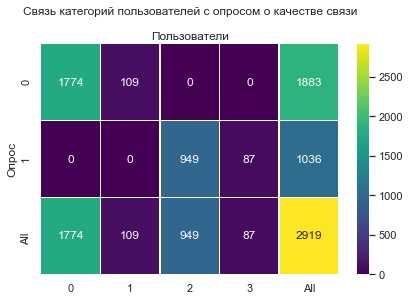

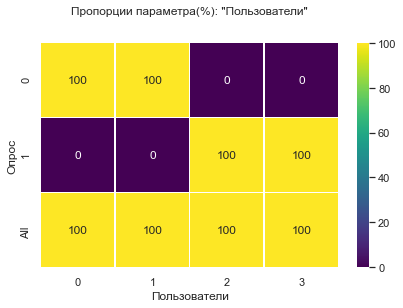

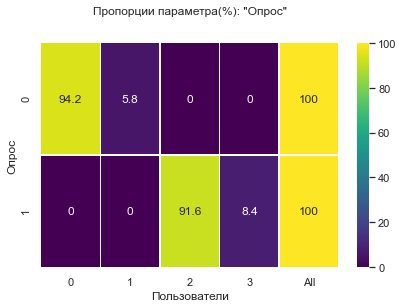

In [102]:
# Отношения Старый опрос - Новые классы пользователей
my.class_describe(
                  data_y= data_all_trim['Q1_cat'],
                  data_x= data_all_trim['new_cls'],
                  name_y='Опрос',
                  name_x='Пользователи',
                  name_title='Связь категорий пользователей с опросом о качестве связи')

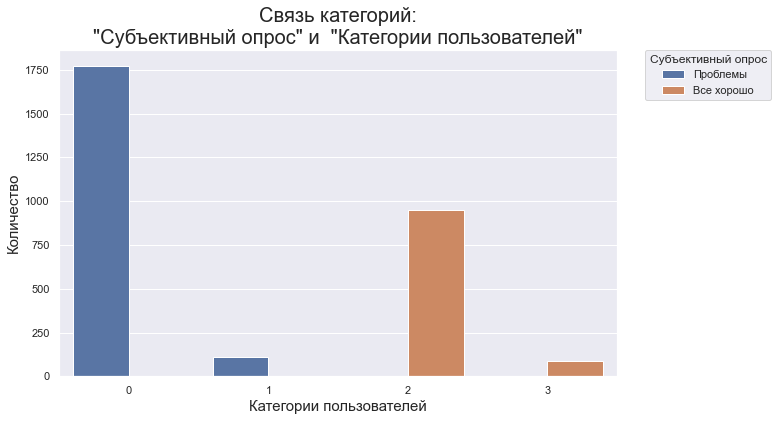

In [103]:
my.categor_pair(
                df = data_all_trim,
                cat_main='Q1_cat',
                cat_x= 'new_cls',
                name_main='Субъективный опрос',
                name_x='Категории пользователей',
                lst_main=['Проблемы','Все хорошо']
                )

__ВЫВОД__<br>
- Участники опроса с ответом "Проблемы" большинство отнесены к категории "Эксперты_0" и в незначительной части к "Пессимисты_1";<br>
- Участники опроста с ответом "Все хорошо" большинсто отнесены к категории "Оптимисты_2" и в незначительной части к "Эксперты_3".<br>

Выделяется низкая объективность пользователей давших ответ "Все хорошо"

Рассмотрим соотношение объективного качества связи с категориями пользователей.

<Figure size 720x864 with 0 Axes>

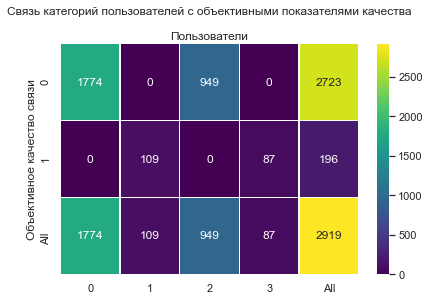

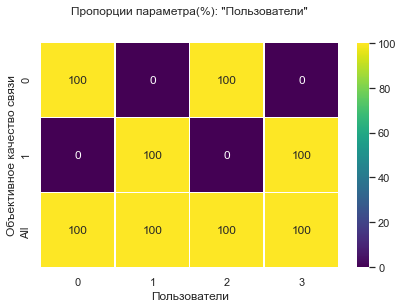

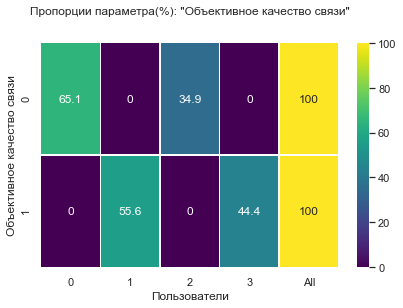

In [104]:
my.class_describe(
               data_y= data_all_trim['Q1_new'],
               data_x= data_all_trim['new_cls'],
               name_y='Объективное качество связи',
               name_x='Пользователи',
               name_title='Связь категорий пользователей с объективными показателями качества')

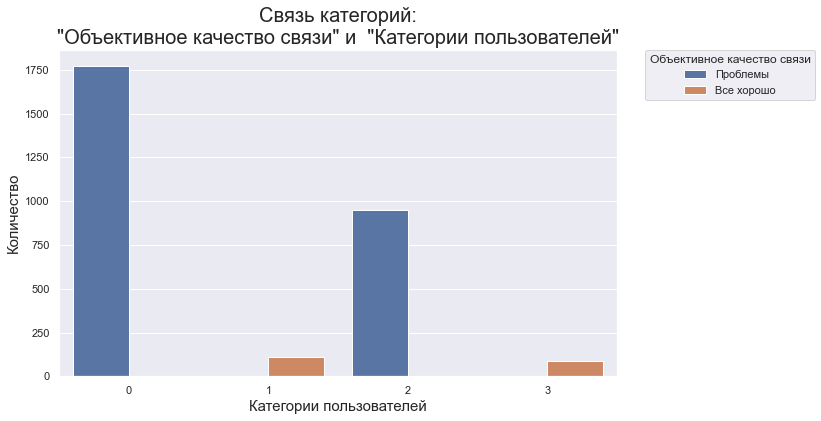

In [105]:
my.categor_pair(
                df = data_all_trim,
                cat_main='Q1_new',
                cat_x= 'new_cls',
                name_main='Объективное качество связи',
                name_x='Категории пользователей',
                lst_main=['Проблемы','Все хорошо']
                )

__ВЫВОД__<br>
- Самая массовая и точная в оценке качества связи категория "Эсперты_0";<br>
- Самая неточная в оценке качества связи категория "Оптимисты_2";<br>
- Категории "Пессимисты_2" и "Эксперты_3" малочисленны.

"Субъективное" и "объективное" распределение пользователей

In [106]:
# Переименование переменных в столбце
def rename_var(data_df, col_name, var_lst, var_lst_new):
    data_df[col_name +'_C'] = data_df[col_name].replace(var_lst, var_lst_new)
    return data_df

In [107]:
# подготовка данных для графиков
df = data_all_trim.copy()
df = df[['Q1_cat','Q1_new','new_cls','user_id']]
df = rename_var(df,'Q1_cat',[0,1],['Проблемы','Все хорошо'])
df = rename_var(df,'new_cls',[0,1,2,3],['Эксперт_0','Пессимист_1','Оптимист_2','Эксперт_3'])
df = rename_var(df,'Q1_new',[0,1],['Проблемы','Все хорошо'])

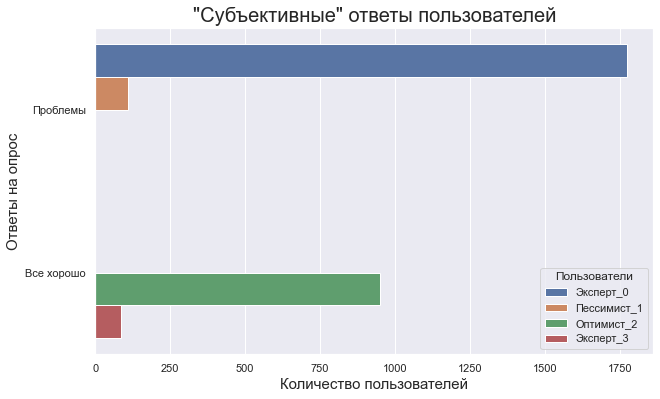

In [108]:
#  Субъективные ответы
sns.set()
plt.figure(figsize = (10,6))
g = sns.countplot(y="Q1_cat_C", hue="new_cls_C", data=df)
g.legend(title="Пользователи")
plt.title('"Cубъективные" ответы пользователей', fontsize = 20)
plt.ylabel("Ответы на опрос", fontsize = 15)
plt.xlabel("Количество пользователей", fontsize = 15)

plt.show()

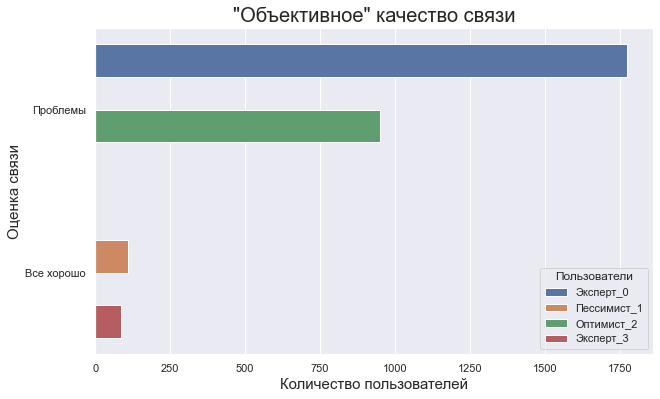

In [109]:
#  Объективные ответы
sns.set()
plt.figure(figsize = (10,6))
g = sns.countplot(y="Q1_new_C", hue="new_cls_C", data=df)
g.legend(title="Пользователи")
plt.title('"Объективное" качество связи', fontsize = 20)
plt.ylabel("Оценка связи", fontsize = 15)
plt.xlabel("Количество пользователей", fontsize = 15)
plt.show()


### Сравним профили по категориям пользователей


In [110]:
# Фильтруем фичи для  создания профилей
filter_f =   [
                # 'Q1_cat',
                # 'user_id',
                # 'Total (MB)',
                'Downlink (Kbps)',
                'Uplink (Kbps)',
                'Downlink TCP Rate(%)',
                'Video Download (Kbps)',
                'Video Delay (ms)',
                'Web Download (Kbps)',
                'Web TCP RTT(ms)',
                 ]

X_data,y_data = data_all_trim[filter_f], data_all_trim['new_cls']

In [111]:
# Нормализуем данные для графика (диапазон от 0 до 1)
X_std = (X_data- X_data.min(axis=0)) / (X_data.max(axis=0) - X_data.min(axis=0))
X_std = pd.concat([X_std, y_data], axis=1)

# данные по классам пользователей
X_0 = X_std.query('new_cls == 0').drop(['new_cls'], axis = 1)
X_1 = X_std.query('new_cls == 1').drop(['new_cls'], axis = 1)
X_2 = X_std.query('new_cls == 2').drop(['new_cls'], axis = 1)
X_3 = X_std.query('new_cls == 3').drop(['new_cls'], axis = 1)

In [112]:
# определим макс радиус радара
up_limit = round(max([X_0.median().max(),X_1.median().max(),X_2.median().max(),X_3.median().max()]),2)

__Эксперты_0 и Песcимисты_1__

In [113]:
_ = my.radar_visual('median',
                          X_0, X_1,
                          'Эксперты_0','Песcимисты_1',
                          up_limit,
                          inf = ' ("Эксперты_0 и Песcимисты_1")' )

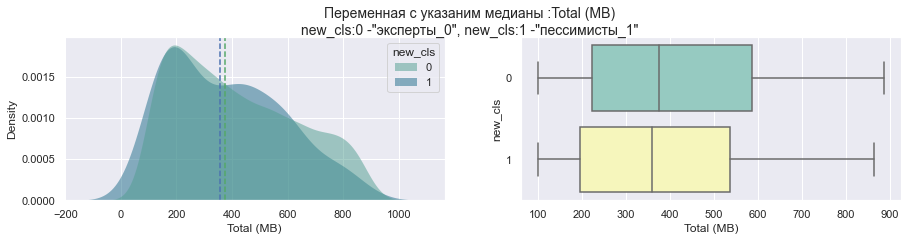

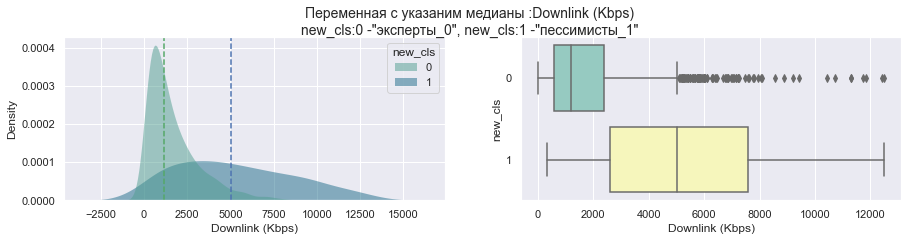

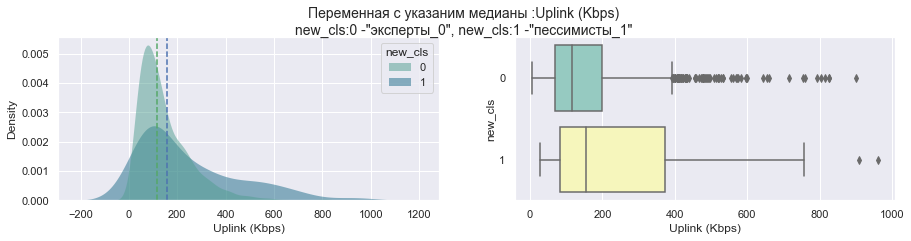

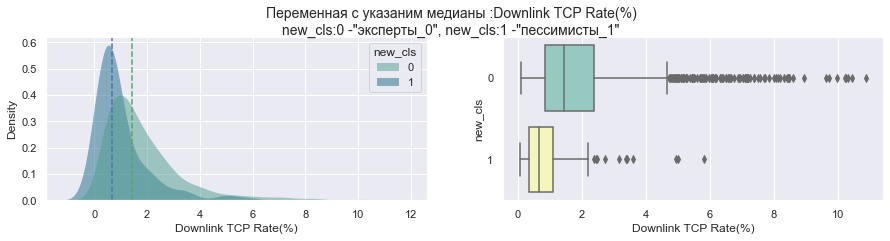

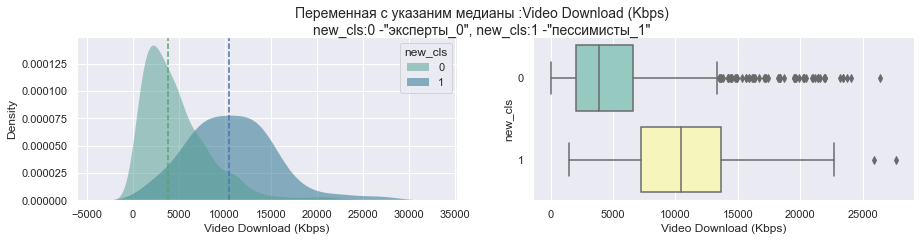

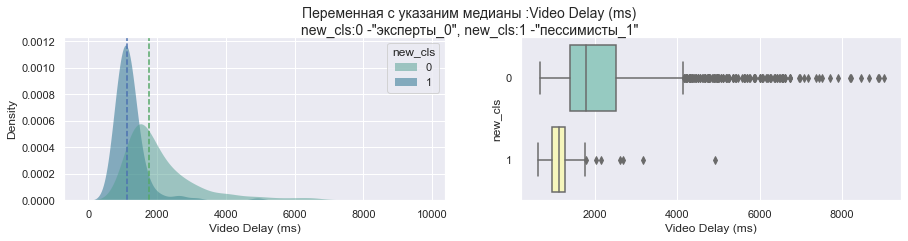

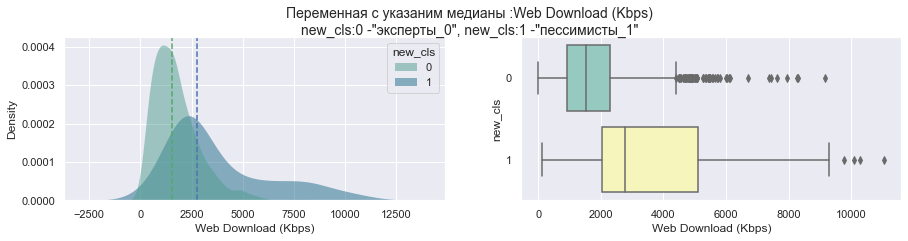

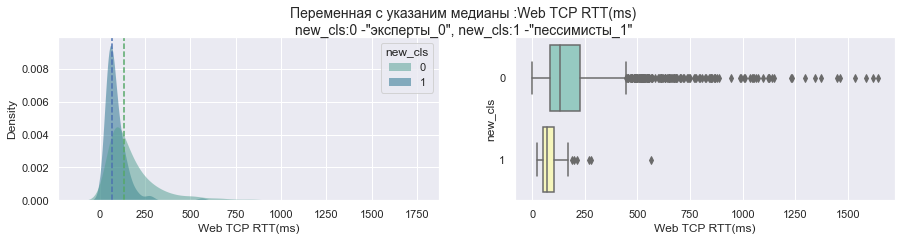

In [114]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'new_cls',
                cls_lst = [0,1],
                var_lst= lst_second,
                name1= user_info[0],
                name2=user_info[1]
                )

__ВЫВОД__<br>
- Существенная разница в характеристиках связи;<br>
- Преимущество категории __Песcимисты_1__.

__Пессимисты_1 и Оптимисты_2__

In [115]:
_ = my.radar_visual('median',
                          X_1, X_2,
                          'Пессимисты_1','Оптимисты_2',
                          up_limit,
                          inf = ' ("Пессимисты_1 и Оптимисты_2")' )

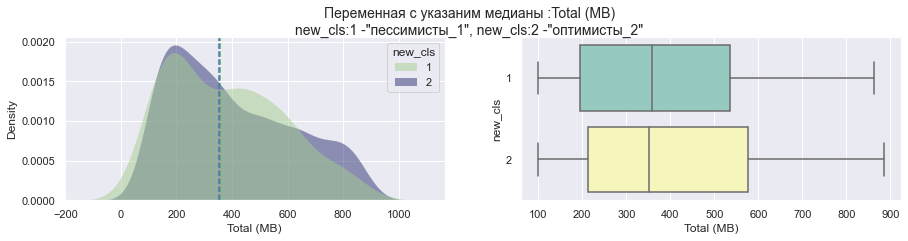

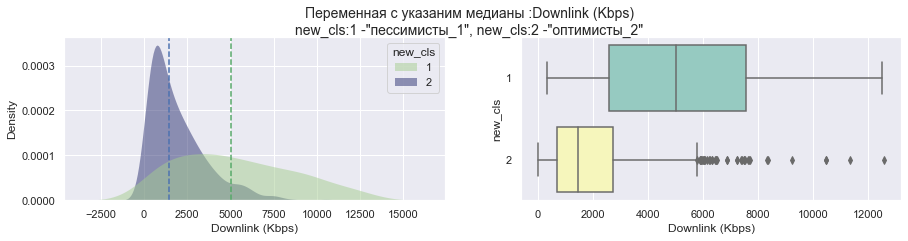

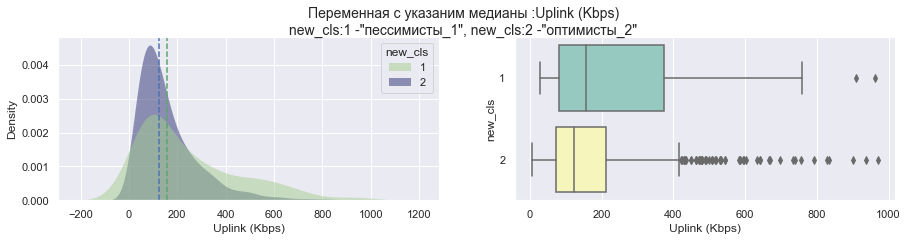

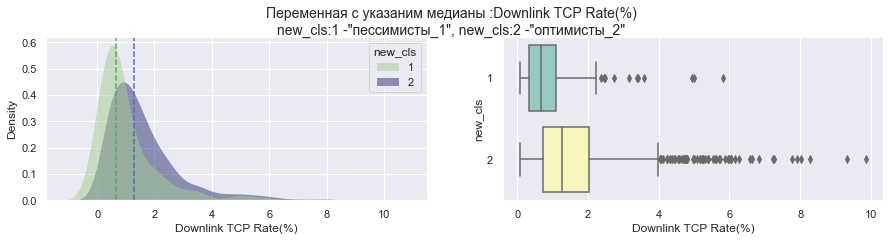

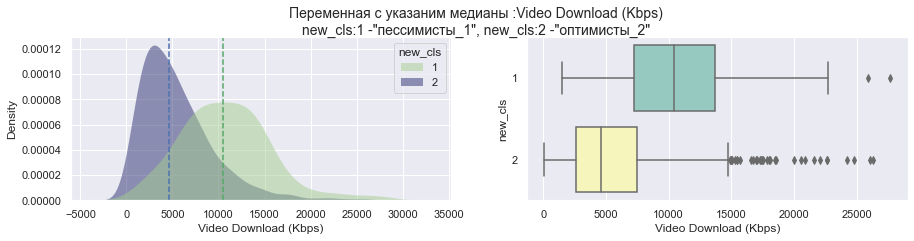

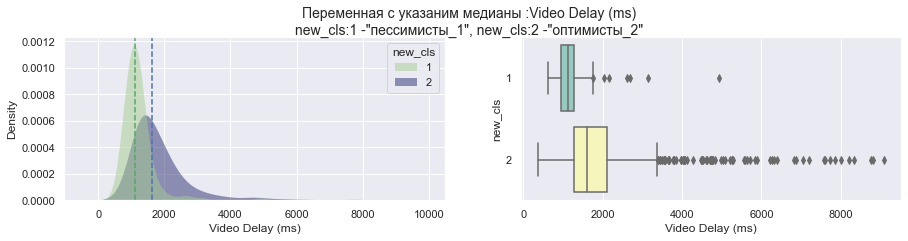

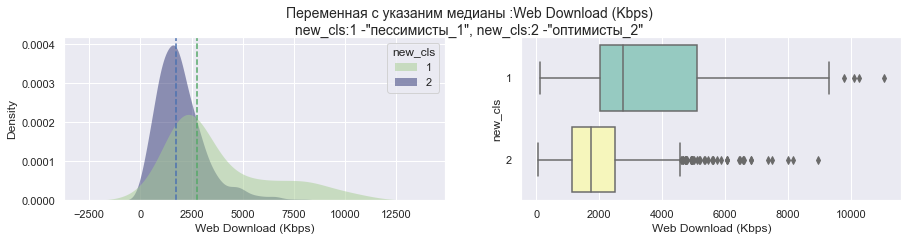

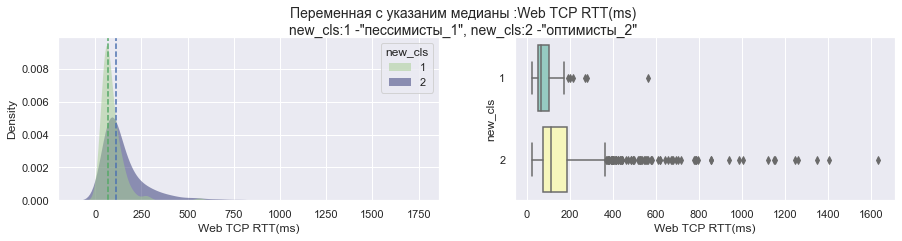

In [116]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'new_cls',
                cls_lst = [1,2],
                var_lst= lst_second,
                name1=user_info[1],
                name2=user_info[2]
                )

__ВЫВОД__<br>
- Существенная разница в характеристиках связи;<br>
- Преимущество категории __Песcимисты_1__.

__Эксперты_0 и Оптимисты_2__

In [117]:
_ = my.radar_visual('median',
                          X_0, X_2,
                          'Эксперты_0','Оптимисты_2',
                          up_limit,
                          inf = ' ("Эксперты_0 и Оптимисты_2")' )

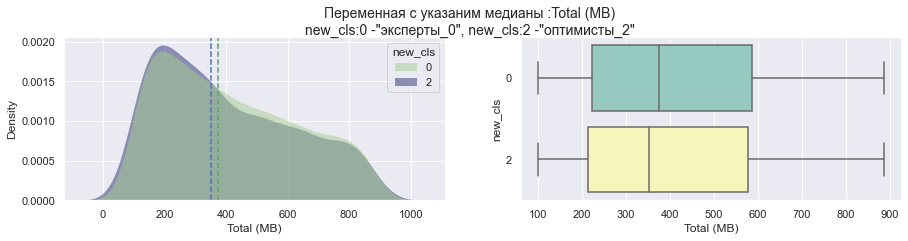

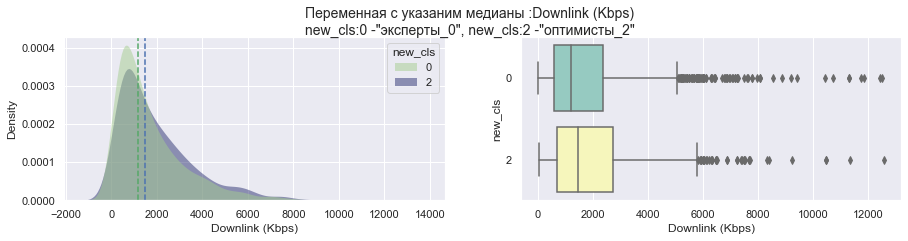

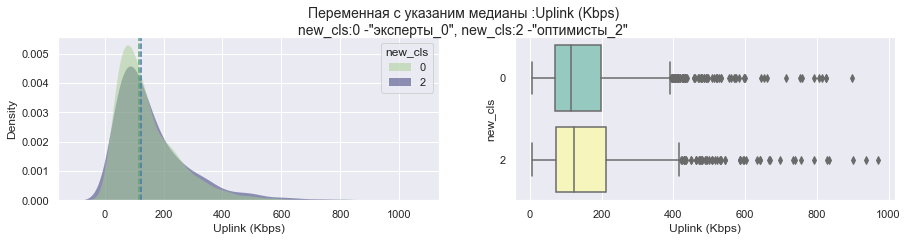

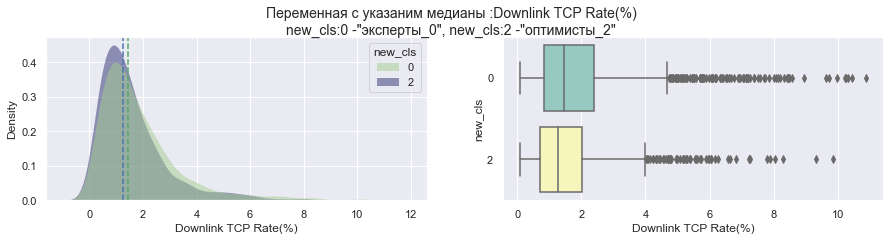

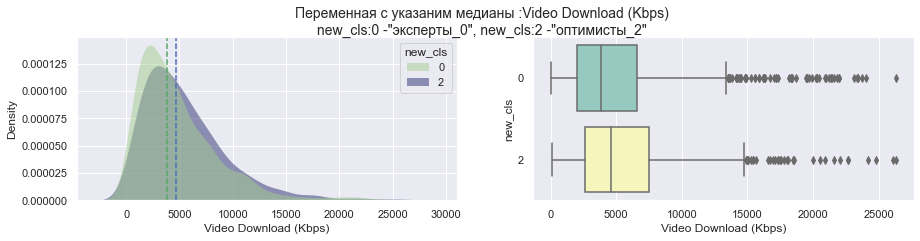

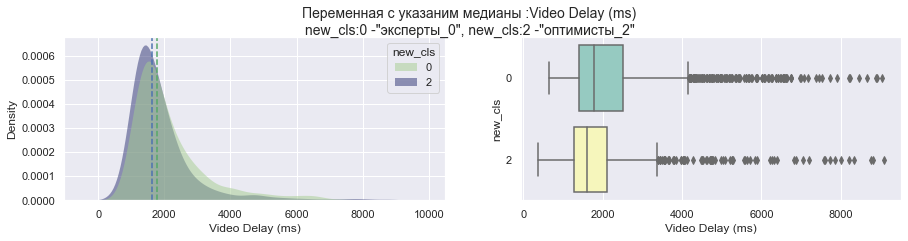

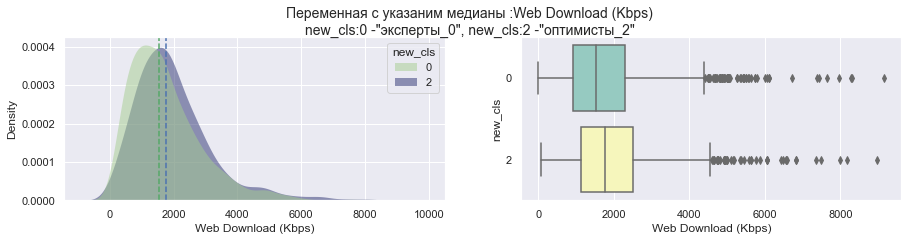

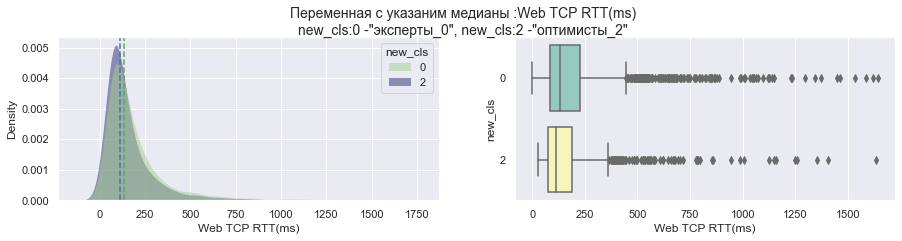

In [118]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'new_cls',
                cls_lst = [0,2],
                var_lst= lst_second,
                name1=user_info[0],
                name2=user_info[2]
                )

__ВЫВОД__<br>
- Существенная разница __отсутствует__ в характеристиках связи;<br>
- Малое преимущество категории __Оптимисты_2__.

__Оптимисты_2 и Эксперты_3__

In [119]:
_ = my.radar_visual('median',
                          X_2, X_3,
                          'Оптимисты_2','Эксперты_3',
                          up_limit,
                          inf = ' ("Оптимисты_2 и Эксперты_3")' )

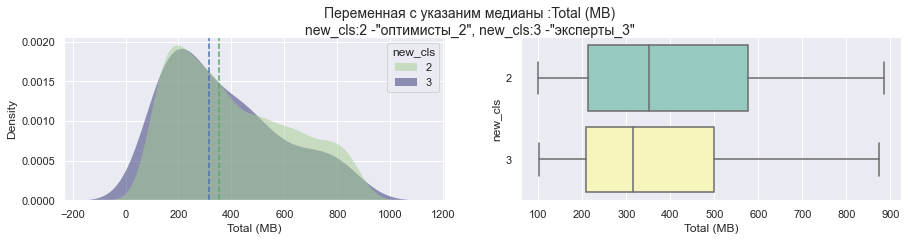

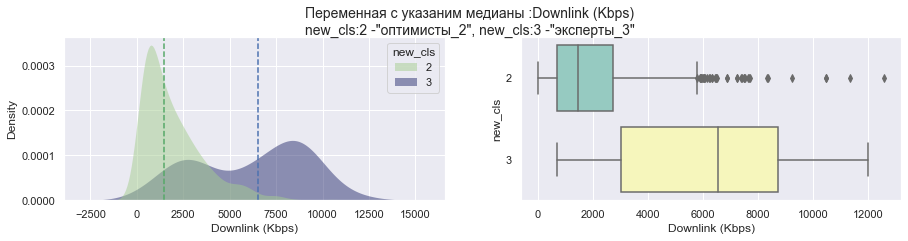

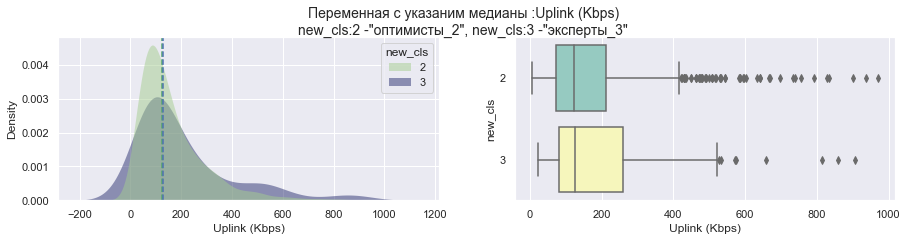

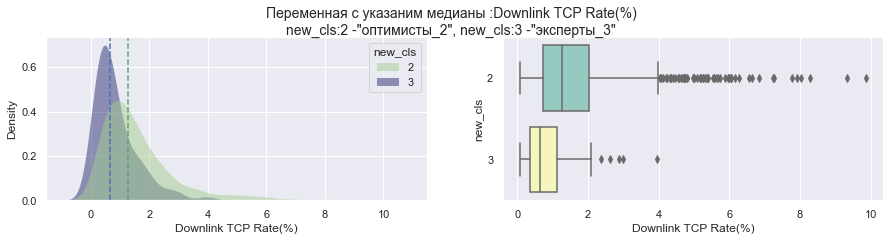

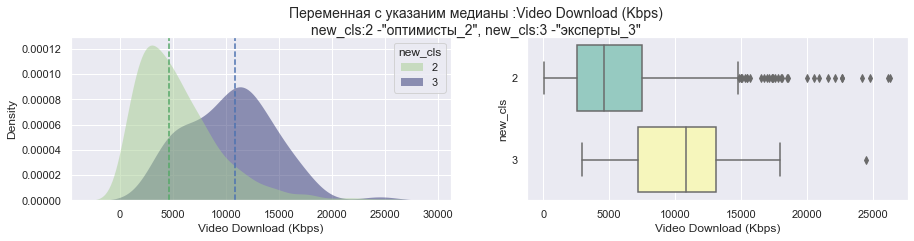

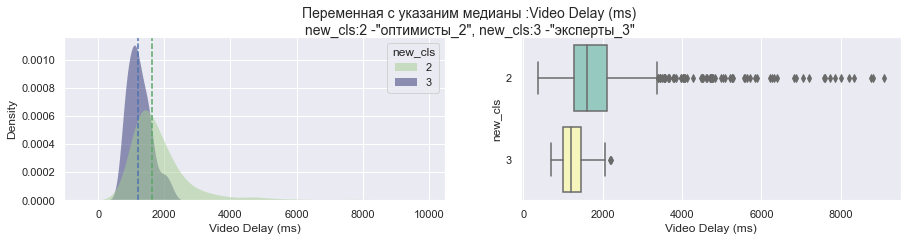

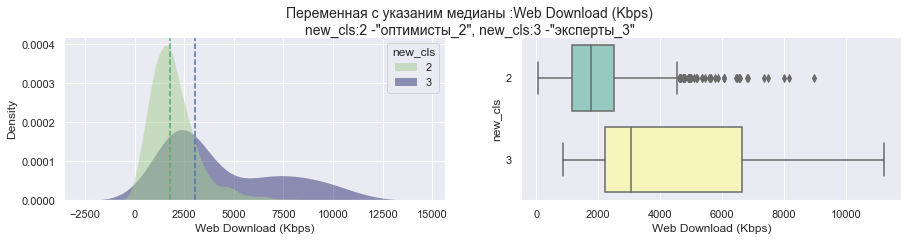

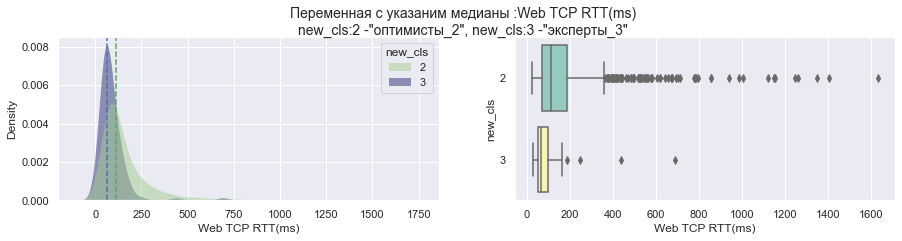

In [120]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'new_cls',
                cls_lst = [2,3],
                var_lst= lst_second,
                name1=user_info[2],
                name2=user_info[3]
                )

__ВЫВОД__<br>
- Существенная разница в характеристиках связи;<br>
- Преимущество категории __Эксперты_3__.


__Эксперты_0 и Эксперты_3__

In [121]:
_ = my.radar_visual('median',
                          X_0, X_3,
                          'Эксперты_0','Эксперты_3',
                          up_limit,
                          inf = ' ("Эксперты_0 и Эксперты_3")' )

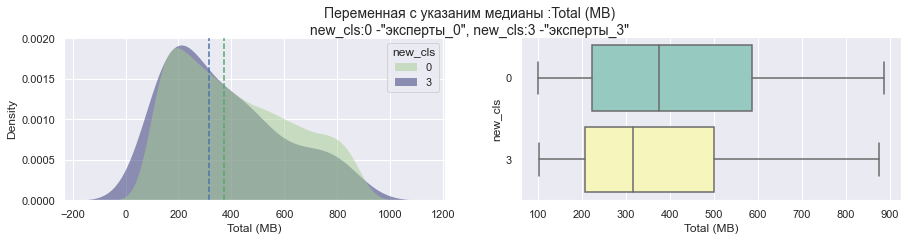

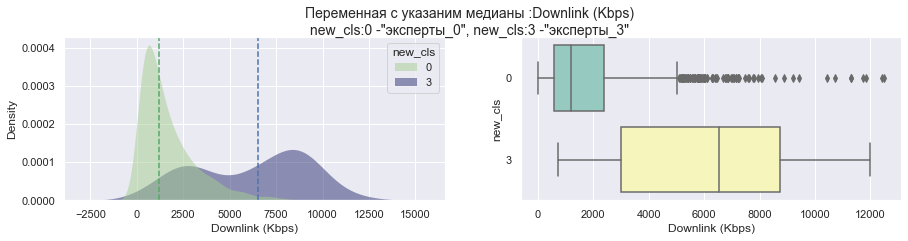

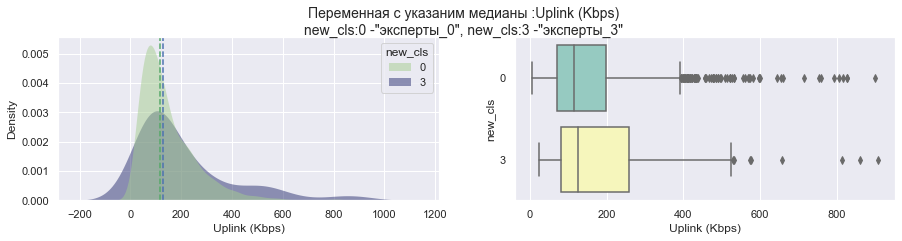

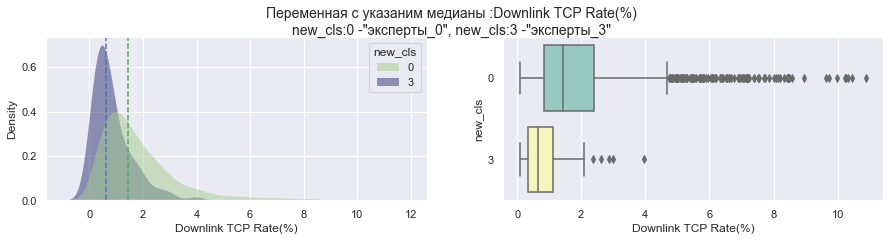

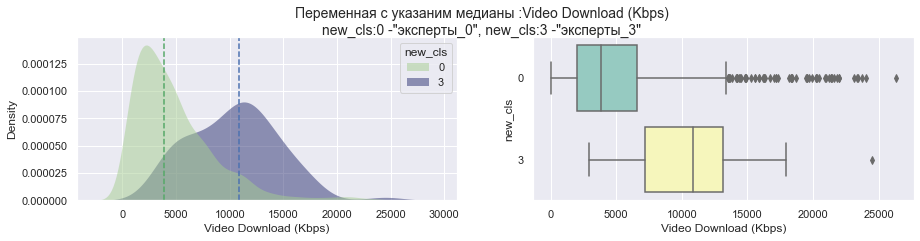

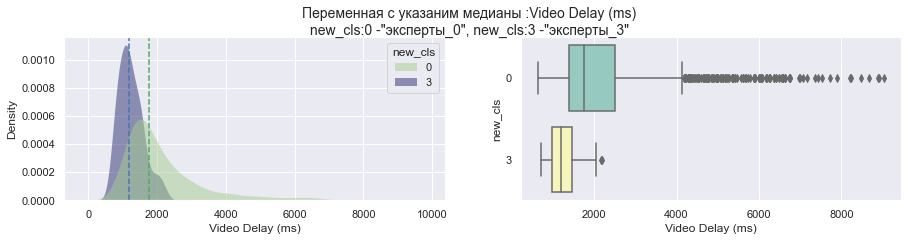

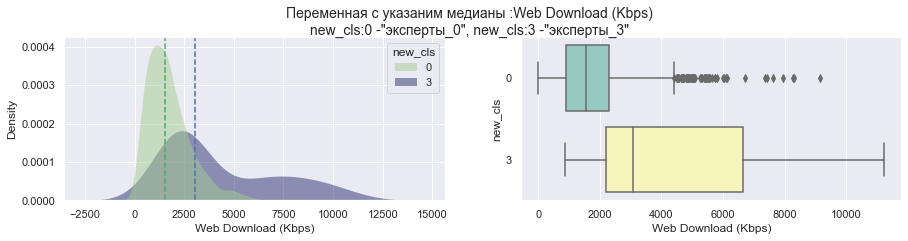

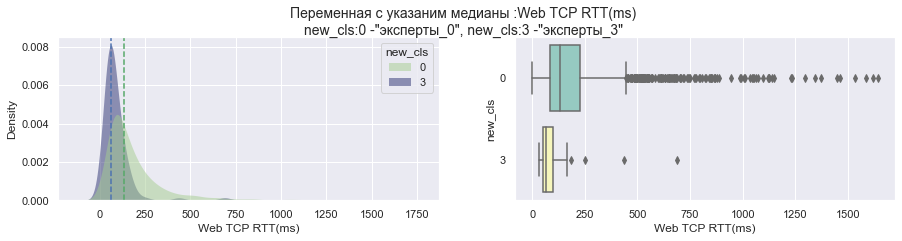

In [122]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'new_cls',
                cls_lst = [0,3],
                var_lst= lst_second,
                name1=user_info[0],
                name2=user_info[3]
                )

__ВЫВОД__<br>
- Существенная разница в характеристиках связи;<br>
- Преимущество категории __Эксперты_3__.


__Пессимисты_1 и Эксперты_3__

In [123]:
_ = my.radar_visual('median',
                          X_1, X_3,
                          'Пессимисты_1','Эксперты_3',
                          up_limit,
                          inf = ' ("Пессимисты_1 и Эксперты_3")' )

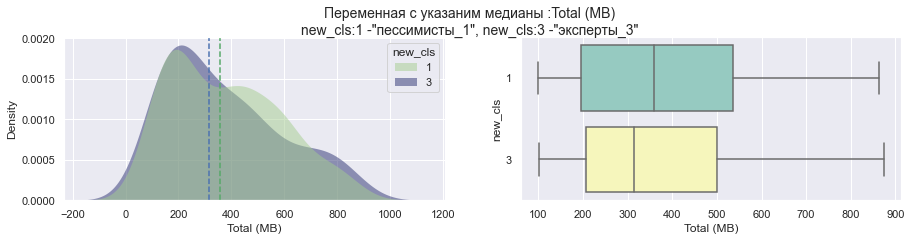

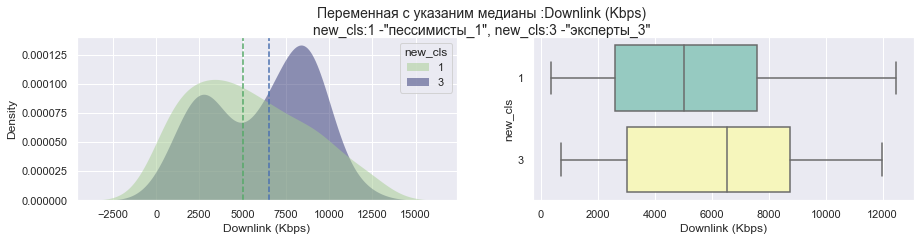

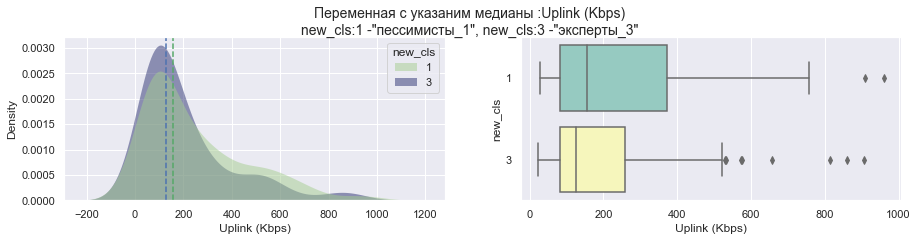

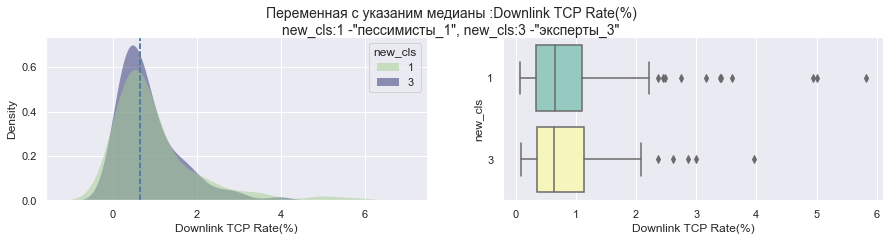

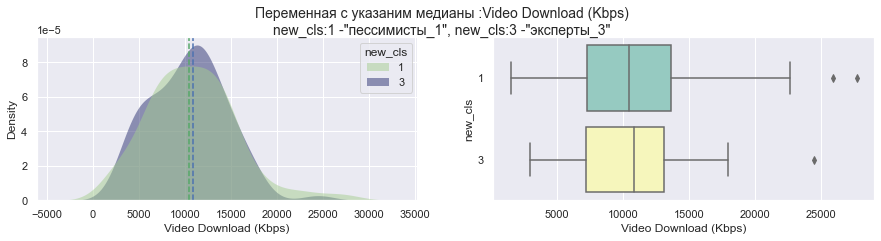

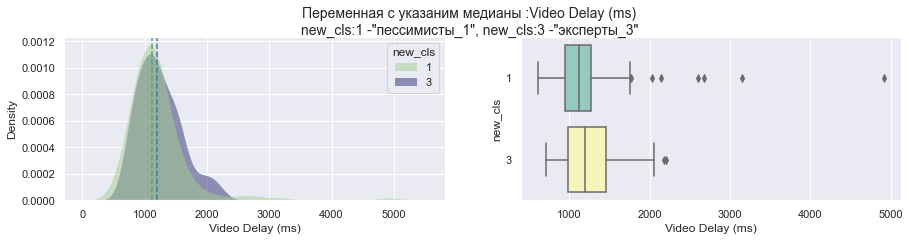

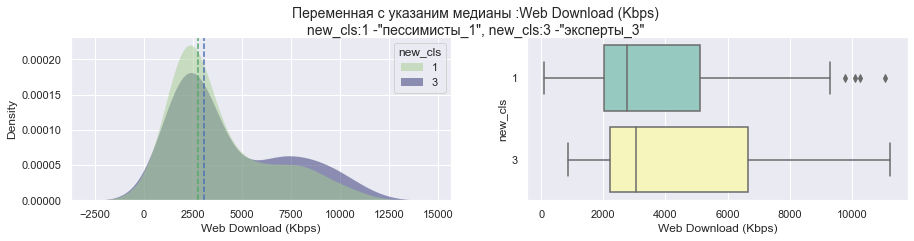

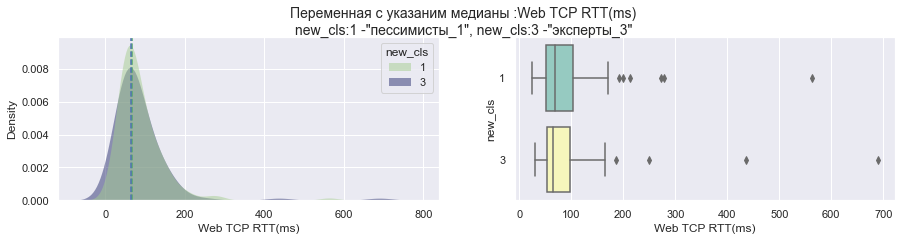

In [124]:
# сравнение распределений
my.compare_pair(
                dat_df = data_all_trim,
                cls_col = 'new_cls',
                cls_lst = [1,3],
                var_lst= lst_second,
                name1=user_info[1],
                name2=user_info[3]
                )

__ВЫВОД__<br>
- Существенная разница __отсутствует__ в характеристиках связи;<br>
- Незначительное преимущество категории __Эксперты_3__.

# 7.Модель классификации пользователей
[Top](#Диплом)

Построим модель по предсказанию вида пользователя по параметрам связи и его ответу на опрос<br>
Модель реализуем на алгоритме __Random Forest__

In [125]:
from sklearn.preprocessing import LabelBinarizer
# Процедура построения модели
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

def RandomForest_model(data, select_data,target='new_cls'):
    data =data[select_data]
    X_data, y_data = data.drop([target], axis = 1), data[target]
    X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=.3, random_state=0)
    clf = RandomForestClassifier(n_estimators=300,
                             random_state=42,
                             max_features= 2,
                             # max_depth= 20,
                             n_jobs=-1)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    df_confusion = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)
    my.class_describe(df = df_confusion)
    # Качество модели
    print('classification_report:\n',classification_report(y_test, y_pred))
    roc_auc = round(multiclass_roc_auc_score(y_test, y_pred, average="macro"), 2)
    print('multiclass_roc_auc_score: ',roc_auc)
    #значимость переменных
    feature_importances = clf.feature_importances_
    feature_importances_df = pd.DataFrame({'feature': list(X_train),
                                       'feature_importances':feature_importances, })
    feature_importances_df.sort_values('feature_importances', ascending = False, inplace=True)

    return (feature_importances_df,
            classification_report(y_test, y_pred),
            roc_auc
            )


In [126]:
# фильтр данных для модели
select_data_1=[
             'Q1_cat',
             # 'user_id',
             'Total (MB)',
             'Downlink (Kbps)',
             'Uplink (Kbps)',
             'Downlink TCP Rate(%)',
             'Video Download (Kbps)',
             'Video Delay (ms)',
             'Web Download (Kbps)',
             'Web TCP RTT(ms)',
             # 'LogisticRegression',
             # 'RandomForest',
             # 'GaussianNB',
             # 'KNeighborsClassifier',
             # 'AdaBoostClassifier',
             # 'threshold',
             # 'y_new',
             'new_cls']

**Входные данные:**

In [127]:
select_data_1

['Q1_cat',
 'Total (MB)',
 'Downlink (Kbps)',
 'Uplink (Kbps)',
 'Downlink TCP Rate(%)',
 'Video Download (Kbps)',
 'Video Delay (ms)',
 'Web Download (Kbps)',
 'Web TCP RTT(ms)',
 'new_cls']

<Figure size 720x864 with 0 Axes>

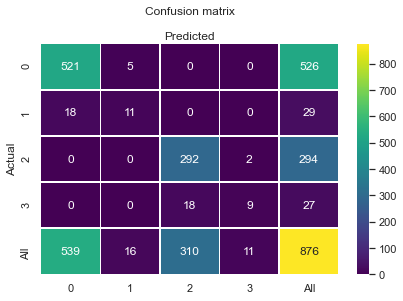

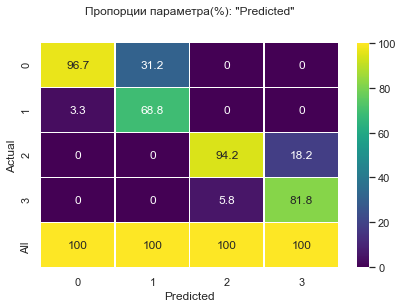

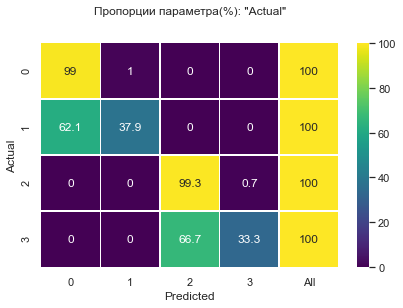

classification_report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       526
           1       0.69      0.38      0.49        29
           2       0.94      0.99      0.97       294
           3       0.82      0.33      0.47        27

    accuracy                           0.95       876
   macro avg       0.85      0.67      0.73       876
weighted avg       0.94      0.95      0.94       876

multiclass_roc_auc_score:  0.83


In [128]:
# Запустим модель с исходными данными
report_1 = RandomForest_model(data_all_trim, select_data_1)

Посмотрим на значимость переменныхи

In [129]:
# значимость перменных
report_1[0]

,feature,feature_importances
0,Q1_cat,0.707851
2,Downlink (Kbps),0.061786
7,Web Download (Kbps),0.039188
6,Video Delay (ms),0.039022
8,Web TCP RTT(ms),0.034772
5,Video Download (Kbps),0.034561
3,Uplink (Kbps),0.029900
4,Downlink TCP Rate(%),0.028634
1,Total (MB),0.024285


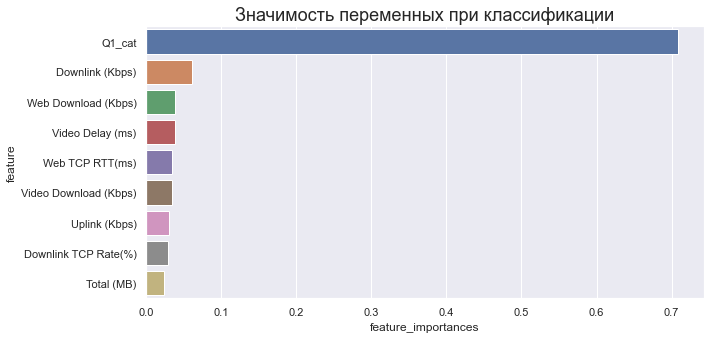

In [130]:
plt.figure(figsize=(10,5))
sns.barplot(data=report_1[0],
            x='feature_importances',
            y= 'feature',
            )
plt.title('Значимость переменных при классификации', fontsize = 18)
plt.show()

__ВЫВОД__<br>
- Модель без настройки параметров и отбора переменных показала удовлетворительный результат.


__Новые данные модели__

In [131]:
# фильтр данных для модели
select_data_2=[
             'Q1_cat',
             # 'user_id',
             # 'Total (MB)',
             'Downlink (Kbps)',
             # 'Uplink (Kbps)',
             # 'Downlink TCP Rate(%)',
             'Video Download (Kbps)',
             'Video Delay (ms)',
             'Web Download (Kbps)',
             'Web TCP RTT(ms)',
             # 'LogisticRegression',
             # 'RandomForest',
             # 'GaussianNB',
             # 'KNeighborsClassifier',
             # 'AdaBoostClassifier',
             # 'threshold',
             # 'y_new',
             'new_cls']

In [132]:
select_data_2

['Q1_cat',
 'Downlink (Kbps)',
 'Video Download (Kbps)',
 'Video Delay (ms)',
 'Web Download (Kbps)',
 'Web TCP RTT(ms)',
 'new_cls']

<Figure size 720x864 with 0 Axes>

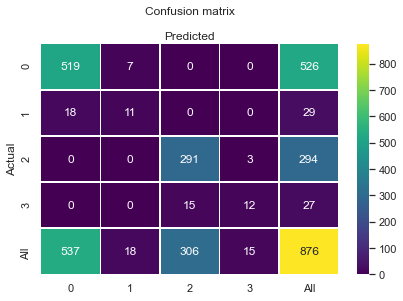

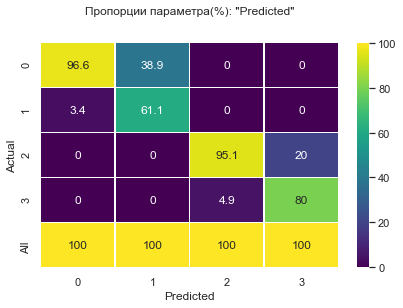

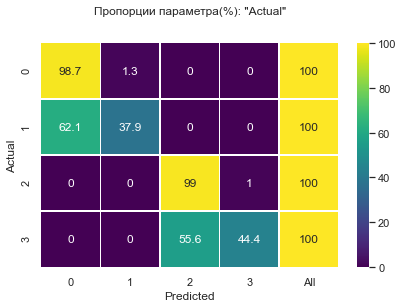

classification_report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       526
           1       0.61      0.38      0.47        29
           2       0.95      0.99      0.97       294
           3       0.80      0.44      0.57        27

    accuracy                           0.95       876
   macro avg       0.83      0.70      0.75       876
weighted avg       0.94      0.95      0.94       876

multiclass_roc_auc_score:  0.84


In [133]:
# Запустим модель с новыми данными
report_2 = RandomForest_model(data_all_trim, select_data_2)

Посмотрим на значимость переменныхи

In [134]:
# значимость перменных
report_2[0]

,feature,feature_importances
0,Q1_cat,0.742109
1,Downlink (Kbps),0.075139
4,Web Download (Kbps),0.050274
3,Video Delay (ms),0.045721
2,Video Download (Kbps),0.044498
5,Web TCP RTT(ms),0.042259


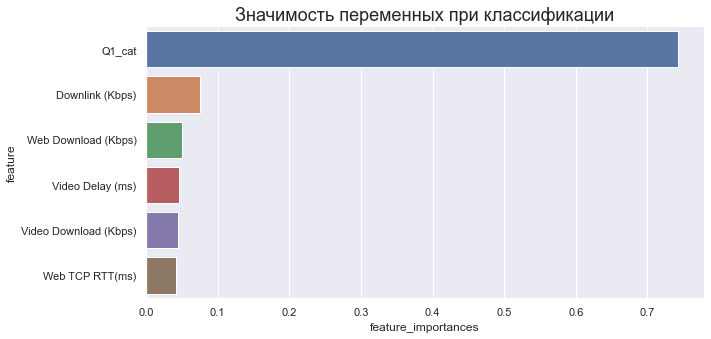

In [135]:
plt.figure(figsize=(10,5))
sns.barplot(data=report_2[0],
            x='feature_importances',
            y= 'feature',
            )
plt.title('Значимость переменных при классификации', fontsize = 18)
plt.show()

__ВЫВОД__<br>
- Простой отбор значимых переменных повысил качество модели.<br>
- Модель демонстрирует средний результат.<br>
- Подбор алгоритма классификации и гиперпараметров возможно увеличит качество классификации.<br>

__Общий подход на дополнительную разметку данных повысил возможности для обработки исходного массива данных.__

# 8.Общие выводы и рекомендации
[Top](#Диплом)

1. Для снижения количества некорректных ответов на вопросы, предалагается внедрить графический интерфейс в  приложении на смартфоне, который визуально будет давать оценку параметров.<br>
2. По результатам первого опроса выявлено следующих три значимых параметра связи:<br>
 - Downlink (Kbps);<br>
 - Video Download (Kbps);<br>
 - Web TCP RTT(ms).<br>
3. По результатам второго вопроса выявлены следующие три значимые причины недостатка качества связи:<br>
 - "3.Плохое качество связи в зданиях, торговых центрах и тп";<br>
 - "1.Недозвоны, обрывы при звонках";<br>
 - "4.Медленный мобильный Интернет".<br>
4. Выявлено значительное расхождение в оценка пользователей качества связи и его реальных показателей. Оценка пользователей носит ярко субъективный характер.<br>
5. Предложен механизм дополнительной разметки данных, который позволяет уточнить категории копльзователей. Это дает возможности получать информацию отдельно от каждой группы пользователей.<br>
6. Новая классификация пользователей дает возможности , как в маркетинговых мероприятиях, так и более объективной оценке качества связи.<br>
7. Построена модель классификации, которая позволяет предсказывать категории пользователей по входным параметрам связи и их субъективной оценке качества связи.<br>
8. В ходе построения модели были выявлены следующие  значимые параметры связи ( по мере  убывания значимости):<br>
 - Downlink (Kbps) ;<br>
 - Web Download (Kbps);<br>
 - Video Delay (ms);<br>
 - Video Download (Kbps).<br>
9. Пункты 2, 3 и 8 определяют первоочередные направления деятельности по повышению доли положительного отклика от пользователей на качество связи.<br>
10. Дополнительного исследования требуют вопросы:<br>
  - Причины лояльности пользователей категории "Оптимисты";<br>
  - Причины нелояльности пользователей категории "Пессимисты";<br>
  - Дополнительные показатели не технического характера, которые влияют на мнение пользователей (возможно соотношение цена-качество).